In [325]:
import csv

# File paths for different CSV files
file_path_fly_large = "flights_large.csv"
file_path_fly_medium = "flights_medium.csv"
file_path_fly_small = "flights_small.csv"
file_path_airport = "airport_codes.csv"

# Function to read a specific column from a CSV file
def read_csv(file_path, column_name, default_value='0.0'):
    values = []  # List to store the extracted values
    column_name = column_name.strip()  # Remove any leading/trailing spaces from the column name

    # Open the CSV file with specified encoding and delimiter
    with open(file_path, mode='r', newline='', encoding='latin1') as file:
        reader = csv.DictReader(file, delimiter='\t')  # Read as dictionary using tab delimiter

        # Iterate over each row in the CSV file
        for row in reader:
            value = row.get(column_name, default_value)  # Get the value from the specified column
            if value is None:
                value = default_value  # Use default if value is missing
            else:
                value = value.strip()  # Clean the value
            values.append(value if value else default_value)  # Append cleaned or default value

    return values  # Return the list of values

The read_csv function extracts values from a specific column in a CSV file, handling missing or invalid data by replacing it with a default value.
It opens the CSV file, iterates through each row, and fetches the value from the specified column. If the value is missing or empty, it substitutes a default value ('0.0').
The function ensures that even if the column contains empty or malformed entries, a valid list of values is returned.

TASK 1
part 1

In [253]:
def average_speed(file_path):
    distance = read_csv(file_path, "distance")
    time = read_csv(file_path, "air_time")

    # Convert strings to floats, and divide time by 100
    distance_converted = [float(x) for x in distance]
    time_converted = [float(x) / 100 for x in time]

    speed = []
    for d, t in zip(distance_converted, time_converted):
        if t != 0:
            speed.append(round(d / t, 2))  # Calculate speed and round to 2 decimals
        else:
            speed.append(0)  # Avoid division by zero

    return speed

This function calculates the average speed of each flight by dividing the distance by the adjusted air time. It handles cases where air time is zero to avoid division errors.

In [254]:
avarage_speed_minimum= average_speed(file_path_fly_small)
avarage_speed_medium = average_speed(file_path_fly_medium)
avarage_speed_large = average_speed(file_path_fly_large)
print(avarage_speed_minimum)
print(avarage_speed_medium)
print(f"First 150000 values of large dataset: {avarage_speed_large[:150000]}")


[674.29, 743.24, 825.73, 635.96, 445.83, 0, 734.92, 806.19, 521.05, 536.26, 686.27, 683.87, 683.94, 484.27, 800.85, 697.18, 705.33, 726.04, 495.65, 711.3, 736.24, 643.28, 684.31, 688.71, 647.3, 557.41, 719.65, 697.18, 591.11, 647.62, 555.1, 774.25, 335.71, 837.82, 0, 541.9, 532.59, 697.12, 525.71, 471.79, 599.1, 781.27, 861.05, 699.25, 587.69, 771.83, 649.39, 752.82, 734.42, 730.48, 678.3, 530.23, 650.69, 659.72, 759.2, 740.85, 698.92, 503.81, 800.62, 706.12, 475.0, 598.57, 755.86, 662.56, 771.94, 750.68, 739.82, 268.57, 530.43, 0, 725.15, 745.8, 705.66, 528.07, 672.33, 678.21, 465.12, 647.62, 635.29, 486.36, 798.21, 646.15, 561.11, 734.66, 567.11, 464.44, 453.19, 665.62, 716.13, 610.83, 737.5, 575.0, 793.27, 769.07, 706.49, 655.56, 708.0, 683.82, 676.58, 711.88, 765.03, 632.08, 0, 540.54, 678.7, 286.44, 739.38, 0, 616.18, 713.65, 567.92, 779.74, 694.12, 745.23, 467.35, 579.59, 689.36, 690.48, 671.25, 403.77, 714.93, 592.06, 722.73, 709.06, 642.86, 661.25, 745.32, 713.73, 526.32, 707.9

In [326]:
import statistics

# Function to calculate basic statistics on flight speeds
def calculate_statistics(speed, origin, destination, iata, city):
    # Filter out zero speeds and convert values to float
    speed_float = [float(x) for x in speed if float(x) != 0]

    # Calculate statistical values
    min_value = min(speed_float)
    max_value = max(speed_float)
    mean_value = statistics.mean(speed_float)
    median_value = statistics.median(speed_float)

    # Find indexes of minimum and maximum speeds
    min_index = speed_float.index(min_value)
    max_index = speed_float.index(max_value)

    # Get IATA codes for origin and destination airports at min/max speed
    origin_min = origin[min_index]
    destination_min = destination[min_index]
    origin_max = origin[max_index]
    destination_max = destination[max_index]

    # Function to safely find index in IATA list (returns None if not found)
    def get_iata_index(iata_list, code):
        try:
            return iata_list.index(code)
        except ValueError:
            return None  # Return None if code is not found

    # Get indices of origin and destination codes in the IATA list
    index_origin_min = get_iata_index(iata, origin_min)
    index_origin_max = get_iata_index(iata, origin_max)
    index_destination_min = get_iata_index(iata, destination_min)
    index_destination_max = get_iata_index(iata, destination_max)

    # Check if the indices exist and retrieve corresponding city names
    if index_origin_min is not None:
        final_origin_min = city[index_origin_min]
    else:
        final_origin_min = 'Unknown'

    if index_origin_max is not None:
        final_origin_max = city[index_origin_max]
    else:
        final_origin_max = 'Unknown'

    if index_destination_min is not None:
        final_destination_min = city[index_destination_min]
    else:
        final_destination_min = 'Unknown'

    if index_destination_max is not None:
        final_destination_max = city[index_destination_max]
    else:
        final_destination_max = 'Unknown'

    # Return all relevant statistics and mapped city names
    return {
        'speed_float': speed_float,
        'min_value': min_value,
        'max_value': max_value,
        'mean_value': mean_value,
        'median_value': median_value,
        'min_index': min_index,
        'max_index': max_index,
        'final_origin_min': final_origin_min,
        'final_origin_max': final_origin_max,
        'final_destination_min': final_destination_min,
        'final_destination_max': final_destination_max
    }



This function processes a list of flight speeds to compute key statistics (minimum, maximum, mean, median) while ignoring invalid or zero values. It also maps the fastest and slowest flights to their corresponding origin and destination cities using IATA codes. This is useful for analyzing flight performance, identifying outliers, and linking statistical results to real-world geographic locations.

In [327]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Function to create a bar chart displaying flight speeds and key statistics
def plot_speed_chart(statistics):
    # Extract values from the statistics dictionary
    speed_float = statistics['speed_float']
    min_value = statistics['min_value']
    max_value = statistics['max_value']
    mean_value = statistics['mean_value']
    median_value = statistics['median_value']
    min_index = statistics['min_index']
    max_index = statistics['max_index']

    # Define colors for each bar: red for min, green for max, skyblue for others
    colors = [
        'red' if i == min_index else
        'green' if i == max_index else
        'skyblue'
        for i in range(len(speed_float))
    ]

    # Create the bar chart
    plt.figure(figsize=(14, 8))
    bars = plt.bar(range(len(speed_float)), speed_float, color=colors, edgecolor='grey')

    # Customize edge styling for min and max bars
    for i, bar in enumerate(bars):
        if i == min_index or i == max_index:
            bar.set_edgecolor('black')        # Black border for emphasis
            bar.set_linewidth(2.5)            # Thicker border for visibility

    # Add annotations for minimum and maximum speed
    plt.text(min_index, min_value + max(speed_float) * 0.02,
             f'Min: {min_value:.0f} km/h', ha='center', va='bottom', color='black', fontsize=12, fontweight='bold')
    plt.text(max_index, max_value + max(speed_float) * 0.02,
             f'Max: {max_value:.0f} km/h', ha='center', va='bottom', color='black', fontsize=12, fontweight='bold')

    # Draw horizontal lines for mean and median values
    plt.axhline(mean_value, color='orange', linestyle='--', linewidth=2.5, label=f'Mean: {mean_value:.0f} km/h')
    plt.axhline(median_value, color='purple', linestyle=':', linewidth=2.5, label=f'Median: {median_value:.0f} km/h')

    # Format Y-axis ticks to display speed in km/h without decimals
    def y_formatter(x, pos):
        return f'{int(x)} km/h'

    plt.gca().yaxis.set_major_formatter(FuncFormatter(y_formatter))

    # Final chart settings
    plt.title('Bar Chart of Speeds with Min, Max, Mean, and Median', fontsize=16, fontweight='bold')
    plt.xlabel('Index', fontsize=13)
    plt.ylabel('Speed (converted)', fontsize=13)
    plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
    plt.legend(fontsize=12)
    plt.tight_layout()

    # Display the chart
    plt.show()

This function provides a clear visual representation of flight speed data, highlighting minimum and maximum values with distinct colors and borders, while also overlaying key statistical lines (mean and median) to assist in understanding the overall distribution. This type of visualization is valuable for quickly identifying performance outliers and understanding central tendencies within a dataset.

In [265]:
speed= avarage_speed_minimum
origin=read_csv(file_path_fly_small,"origin")
destination= read_csv(file_path_fly_small,"dest")
iata=read_csv(file_path_airport,"IATA")
city= read_csv(file_path_airport,"City")
stats = calculate_statistics(speed, origin, destination, iata, city)

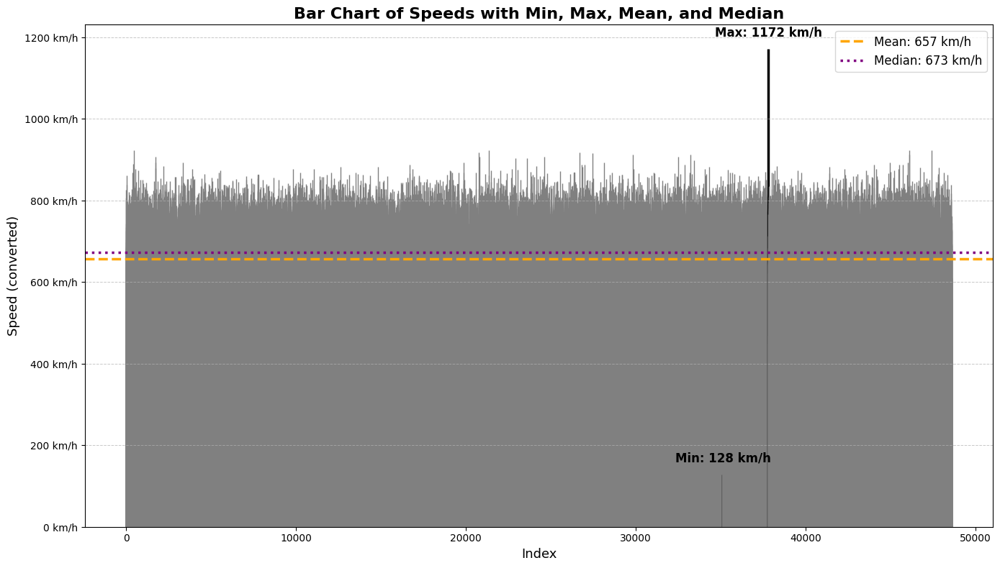

Minimum speed: 128 km/h
Maximum speed: 1172 km/h
Mean speed: 657 km/h
Median speed: 673 km/h
The flight with the highest average speed went from Newark to Orlando
The flight with the lowest average speed went from New York to Atlanta


In [278]:

plot_speed_chart(stats)
print(f"Minimum speed: {stats['min_value']:.0f} km/h")
print(f"Maximum speed: {stats['max_value']:.0f} km/h")
print(f"Mean speed: {stats['mean_value']:.0f} km/h")
print(f"Median speed: {stats['median_value']:.0f} km/h")
print(f"The flight with the highest average speed went from {stats['final_origin_max']} to {stats['final_destination_max']}")
print(f"The flight with the lowest average speed went from {stats['final_origin_min']} to {stats['final_destination_min']}")


This code reads flight speed data, calculates key statistical measures (min, max, mean, and median), and visualizes the speed distribution using a bar chart. It highlights the flights with the highest and lowest speeds, adds horizontal lines for mean and median values, and formats the Y-axis to display speed in "km/h." The results are also printed to provide insights into the flights with the highest and lowest average speeds.

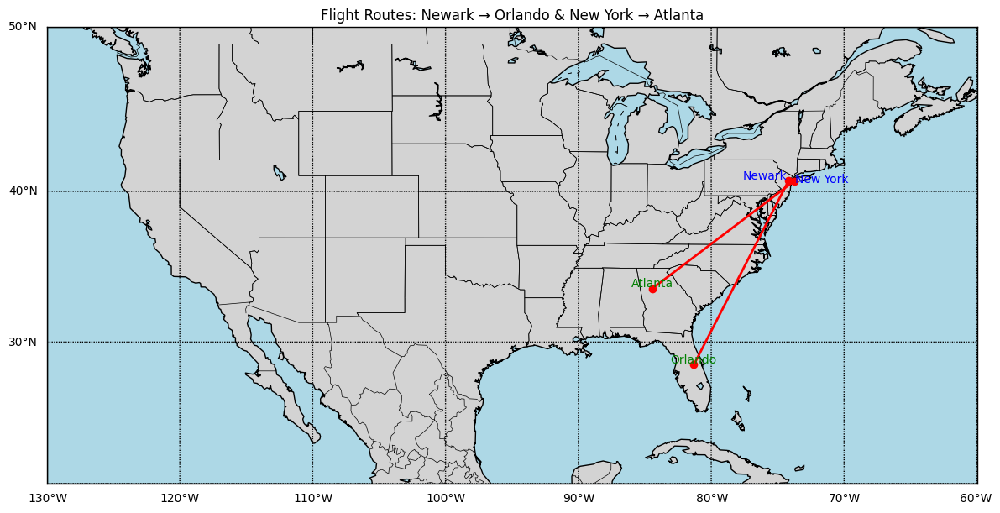

In [7]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

# Coordinates for the cities (latitude, longitude)
routes = [
    {"from": "Newark", "to": "Orlando", "lat1": 40.6895, "lon1": -74.1745, "lat2": 28.4312, "lon2": -81.3081},
    {"from": "New York", "to": "Atlanta", "lat1": 40.6413, "lon1": -73.7781, "lat2": 33.6407, "lon2": -84.4277}
]

# Create the map with a 'mill' projection over the U.S.
plt.figure(figsize=(12, 8))
m = Basemap(projection='mill', llcrnrlat=20, urcrnrlat=50, llcrnrlon=-130, urcrnrlon=-60, resolution='l')

# Draw geographic features
m.drawcoastlines()
m.drawcountries()
m.drawstates()
m.drawmapboundary(fill_color='lightblue')
m.fillcontinents(color='lightgray', lake_color='lightblue')

# Draw parallels and meridians with labels
m.drawparallels(range(20, 51, 10), labels=[1, 0, 0, 0])
m.drawmeridians(range(-130, -59, 10), labels=[0, 0, 0, 1])

# Plot the flight routes with markers and labels
for route in routes:
    # Convert latitude and longitude to map projection coordinates
    x1, y1 = m(route["lon1"], route["lat1"])
    x2, y2 = m(route["lon2"], route["lat2"])

    # Draw the route line between cities
    m.plot([x1, x2], [y1, y2], marker='o', color='red', linewidth=2)

    # Offset labels to prevent overlapping
    if route["from"] == "New York":
        plt.text(x1 + 10000, y1 - 10000, route["from"], fontsize=10, ha='left', color='blue')
    else:
        plt.text(x1 - 10000, y1 + 10000, route["from"], fontsize=10, ha='right', color='blue')

    plt.text(x2, y2 + 10000, route["to"], fontsize=10, ha='center', color='green')

# Title and layout
plt.title("Flight Routes: Newark → Orlando & New York → Atlanta")
plt.tight_layout()
plt.show()


This code visualizes the two selected flight routes on a U.S. map using Basemap. Each route is marked with a red line connecting the departure and arrival cities, with customized labels to distinguish origin and destination points clearly.

TASK 1 PART 2

BUBBLE SORT

In [8]:
def bubble_sort(arr):
    n = len(arr)
    sorted_arr = arr.copy()  # Copy the list to avoid in-place modification
    for i in range(n):
        for j in range(0, n - i - 1):
            if sorted_arr[j] > sorted_arr[j + 1]:
                # Swap the elements
                sorted_arr[j], sorted_arr[j + 1] = sorted_arr[j + 1], sorted_arr[j]
    return sorted_arr

Bubble Sort is a sorting algorithm that repeatedly compares and swaps adjacent elements in the list, pushing the largest values towards the end with each pass. This process continues until the list is completely sorted.

Time Complexity:

Worst case: O(n²)

Best case: O(n)

In [ ]:
import time

# Function to sort data using bubble sort and measure execution time
def bubble_sort_with_time(speed_column):
    # Start measuring time
    start_time = time.time()
    
    # Sort the data using bubble sort
    sorted_speeds = bubble_sort(speed_column)
    
    # Calculate execution time
    execution_time = time.time() - start_time
    
    # Return both the sorted data and execution time
    return sorted_speeds, execution_time

# Call the function for the small dataset
speed_column_small = average_speed(file_path_fly_small)
sorted_speeds_small, execution_time_bubble_sort_small = bubble_sort_with_time(speed_column_small)

# Call the function for the medium dataset
speed_column_medium = average_speed(file_path_fly_medium)
sorted_speeds_medium, execution_time_bubble_sort_medium = bubble_sort_with_time(speed_column_medium)

# Call the function for the large dataset
speed_column_large = average_speed(file_path_fly_large)
sorted_speeds_large, execution_time_bubble_sort_large = bubble_sort_with_time(speed_column_large)

This block applies bubble sort to datasets of increasing size (small, medium, large) and measures the time required to sort each one. The results highlight the performance limitations of bubble sort as data volume increases, demonstrating its inefficiency for larger datasets due to its O(n²) time complexity.

In [271]:

print(f"Results for Small file: Execution Time: {execution_time_bubble_sort_small:.5f} seconds")
print(f"Sorted speeds from Small file (Descending): {sorted_speeds_small[::-1]}")  # Reverse order for descending

print(f"Results for Medium file: Execution Time: {execution_time_bubble_sort_medium:.5f} seconds")
print(f"Sorted speeds from Medium file (Descending): {sorted_speeds_medium[::-1]}")  # Reverse order for descending

# For the Large file, limit the output to the first 150,000 values and reverse order
print(f"Results for Large file: Execution Time: {execution_time_bubble_sort_large:.5f} seconds")
print(f"First 150,000 sorted speeds from Large file (Descending): {sorted_speeds_large[:150000][::-1]}")  # Reverse order for descending


Results for Small file: Execution Time: 66.96048 seconds
Sorted speeds from Small file (Descending): [1172.31, 923.7, 923.7, 923.7, 923.7, 918.39, 917.74, 916.18, 913.14, 913.14, 913.14, 907.95, 907.95, 907.95, 907.95, 903.37, 902.82, 897.75, 893.33, 893.33, 892.74, 892.74, 892.74, 892.74, 890.4, 888.4, 887.78, 887.78, 887.78, 887.78, 887.78, 887.78, 883.93, 883.52, 883.52, 882.87, 882.87, 882.87, 882.87, 882.07, 880.45, 880.45, 878.69, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 876.86, 876.81, 875.56, 874.8, 874.56, 873.91, 873.22, 873.22, 873.22, 873.22, 873.22, 873.22, 873.22, 871.48, 871.2, 870.72, 870.72, 870.21, 869.35, 869.19, 869.19, 869.19, 869.19, 869.19, 869.19, 869.18, 868.71, 868.48, 868.48, 868.48, 868.48, 868.48, 868.48, 868.48, 868.48, 868.42, 867.91, 867.57, 867.38, 867.38, 866.55, 865.93, 865.93, 865.93, 865.93, 865.93, 865.85, 865.38, 865.38, 865.38, 865.38, 865.38, 865.38, 864.66, 864.55, 864.52, 864.29, 863.78, 863.78, 863.78, 863.78, 8

In [272]:
import matplotlib.pyplot as plt

# Function to create the bar chart for Bubble Sort execution times
def plot_bubble_sort_chart(execution_time_bubble_sort_small, execution_time_bubble_sort_medium, execution_time_bubble_sort_large):
    labels = ['Small dataset', 'Medium dataset', 'Large dataset']
    values = [execution_time_bubble_sort_small, execution_time_bubble_sort_medium, execution_time_bubble_sort_large]

    plt.figure(figsize=(9, 6))
    bars = plt.bar(labels, values, color=['lightblue', 'orange', 'red'])
    plt.title("Bubble Sort Execution Time Comparison")
    plt.ylabel("Execution Time (seconds)")

    for bar, val in zip(bars, values):
        plt.text(bar.get_x() + bar.get_width()/2, val, f"{val:.4f}s", ha='center', va='bottom')

    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

This function generates a bar chart comparing the execution times of the Bubble Sort algorithm on three datasets: small, medium, and large. The chart visually represents how the sorting time increases as the dataset size grows, highlighting the inefficiency of the Bubble Sort algorithm for larger datasets. This comparison is useful for analyzing the performance of simple sorting algorithms in different data contexts.

Bubble Sort Time (small): 66.960478 seconds
Bubble Sort Time (medium): 271.303793 seconds
Bubble Sort Time (large): 28237.586719 seconds


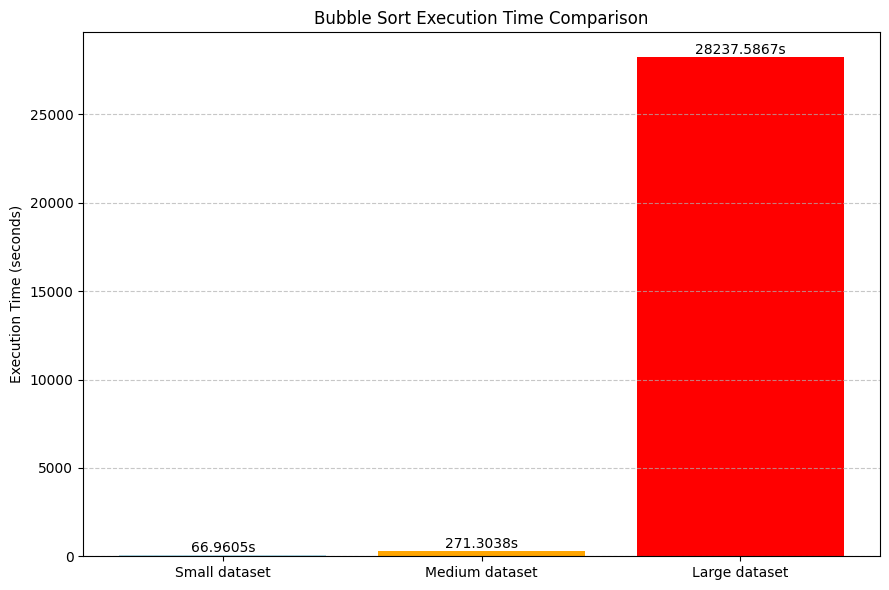

In [273]:
print(f"Bubble Sort Time (small): {execution_time_bubble_sort_small:.6f} seconds")
print(f"Bubble Sort Time (medium): {execution_time_bubble_sort_medium:.6f} seconds")
print(f"Bubble Sort Time (large): {execution_time_bubble_sort_large:.6f} seconds")

# Call the function to plot the chart
plot_bubble_sort_chart(execution_time_bubble_sort_small, execution_time_bubble_sort_medium, execution_time_bubble_sort_large)

# Show the chart
plt.show()

MERGESORT

In [14]:
def merge_sort(arr):
    n = len(arr)
    # Base case: if the list has one or no elements, it's already sorted
    if n <= 1:
        return arr
    
    # Find the midpoint of the list
    mid = n // 2
    
    # Split the list into two halves
    left_half = arr[:mid]
    right_half = arr[mid:]
    
    # Recursively sort both halves
    left_half = merge_sort(left_half)
    right_half = merge_sort(right_half)
    
    # Merge the two sorted halves
    return merge(left_half, right_half)

def merge(left, right):
    sorted_arr = []
    i = j = 0
    
    # Compare elements from both halves and append the smaller one to the sorted list
    while i < len(left) and j < len(right):
        if left[i] < right[j]:
            sorted_arr.append(left[i])
            i += 1
        else:
            sorted_arr.append(right[j])
            j += 1
    
    # Append any remaining elements from the left or right half
    sorted_arr.extend(left[i:])
    sorted_arr.extend(right[j:])
    
    return sorted_arr

# Compute the speed column (you might want to clarify what this refers to)


Merge Sort is a divide-and-conquer sorting algorithm. It works by recursively dividing the input list into two halves, sorting each half, and then merging the sorted halves together. This process continues until the entire list is sorted.

Time Complexity:

Worst case: O(n log n)

Best case: O(n log n)

In [ ]:
import time

def merge_sort_with_time(speed_column):
    # Measure execution time
    start_time = time.time()
    
    # Call the function to sort the data using merge sort
    sorted_speeds = merge_sort(speed_column)
    
    # Calculate execution time
    execution_time = time.time() - start_time
    
    # Return the result and execution time
    return sorted_speeds, execution_time

# Call the function for the Small file
speed_column_small = average_speed(file_path_fly_small)
sorted_speeds_small, execution_time_merge_sort_small = merge_sort_with_time(speed_column_small)

# Call the function for the Medium file
speed_column_medium = average_speed(file_path_fly_medium)
sorted_speeds_medium, execution_time_merge_sort_medium = merge_sort_with_time(speed_column_medium)

# Call the function for the Large file
speed_column_large = average_speed(file_path_fly_large)
sorted_speeds_large, execution_time_merge_sort_large = merge_sort_with_time(speed_column_large)



This function measures the execution time of the Merge Sort algorithm applied to the speed column of flight data. It sorts the data for three datasets of varying sizes (small, medium, large) and tracks the time taken for each sorting operation. The Merge Sort algorithm is more efficient than Bubble Sort, especially for larger datasets, and this comparison highlights its performance advantages in handling substantial amounts of data.

In [207]:
print(f"Results for Small file: Execution Time: {execution_time_merge_sort_small:.5f} seconds")
print(f"Sorted speeds from Small file (Descending): {sorted_speeds_small[::-1]}")  # Reverse order for descending

print(f"Results for Medium file: Execution Time: {execution_time_merge_sort_medium:.5f} seconds")
print(f"Sorted speeds from Medium file (Descending): {sorted_speeds_medium[::-1]}")  # Reverse order for descending

# For the Large file, limit the output to the first 150,000 values and reverse order
print(f"Results for Large file: Execution Time: {execution_time_merge_sort_large:.5f} seconds")
print(f"First 150,000 sorted speeds from Large file (Descending): {sorted_speeds_large[:150000][::-1]}")  # Reverse order for descending


Results for Small file: Execution Time: 0.06748 seconds
Sorted speeds from Small file (Descending): [1172.31, 923.7, 923.7, 923.7, 923.7, 918.39, 917.74, 916.18, 913.14, 913.14, 913.14, 907.95, 907.95, 907.95, 907.95, 903.37, 902.82, 897.75, 893.33, 893.33, 892.74, 892.74, 892.74, 892.74, 890.4, 888.4, 887.78, 887.78, 887.78, 887.78, 887.78, 887.78, 883.93, 883.52, 883.52, 882.87, 882.87, 882.87, 882.87, 882.07, 880.45, 880.45, 878.69, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 876.86, 876.81, 875.56, 874.8, 874.56, 873.91, 873.22, 873.22, 873.22, 873.22, 873.22, 873.22, 873.22, 871.48, 871.2, 870.72, 870.72, 870.21, 869.35, 869.19, 869.19, 869.19, 869.19, 869.19, 869.19, 869.18, 868.71, 868.48, 868.48, 868.48, 868.48, 868.48, 868.48, 868.48, 868.48, 868.42, 867.91, 867.57, 867.38, 867.38, 866.55, 865.93, 865.93, 865.93, 865.93, 865.93, 865.85, 865.38, 865.38, 865.38, 865.38, 865.38, 865.38, 864.66, 864.55, 864.52, 864.29, 863.78, 863.78, 863.78, 863.78, 86

In [274]:
import matplotlib.pyplot as plt

# Function to create the bar chart for Merge Sort execution times
def plot_merge_sort_chart(execution_time_merge_sort_small, execution_time_merge_sort_medium, execution_time_merge_sort_large):
    labels = ['Small dataset', 'Medium dataset', 'Large dataset']
    values = [execution_time_merge_sort_small, execution_time_merge_sort_medium, execution_time_merge_sort_large]

    plt.figure(figsize=(8, 5))
    bars = plt.bar(labels, values, color=['lightgreen', 'forestgreen', 'darkgreen'])
    plt.title("Merge Sort Execution Time Comparison")
    plt.ylabel("Execution Time (seconds)")

    for bar, val in zip(bars, values):
        plt.text(bar.get_x() + bar.get_width()/2, val, f"{val:.4f}s", ha='center', va='bottom')

    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

This function generates a bar chart to visually compare the execution times of the Merge Sort algorithm across three different datasets: small, medium, and large. The chart uses varying shades of green to represent each dataset's sorting time. This visualization helps illustrate how Merge Sort's performance scales with increasing data size, demonstrating its efficiency in handling larger datasets compared to less efficient sorting algorithms.

Merge Sort Time (small): 0.067480 seconds
Merge Sort Time (medium): 0.147013 seconds
Merge Sort Time (large): 0.546510 seconds


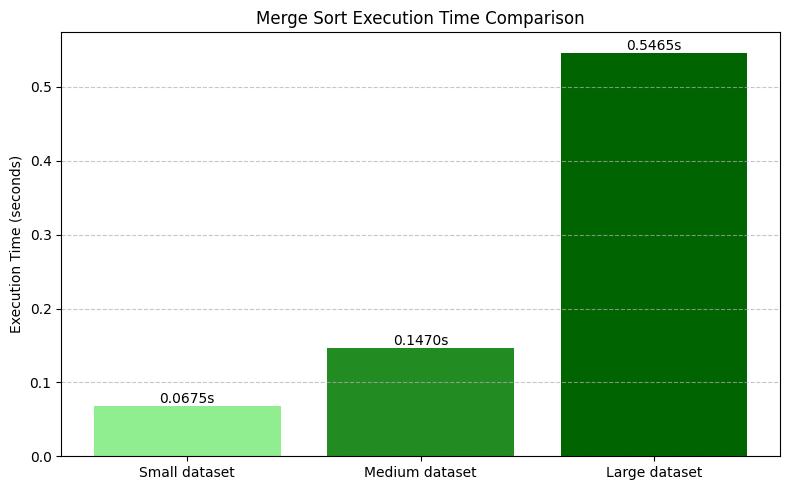

In [275]:
print(f"Merge Sort Time (small): {execution_time_merge_sort_small:.6f} seconds")
print(f"Merge Sort Time (medium): {execution_time_merge_sort_medium:.6f} seconds")
print(f"Merge Sort Time (large): {execution_time_merge_sort_large:.6f} seconds")

# Call the function to plot the chart
plot_merge_sort_chart(execution_time_merge_sort_small, execution_time_merge_sort_medium, execution_time_merge_sort_large)

# Show the chart
plt.show()

QUICKSORT

In [17]:
def quick_sort(arr):
    if len(arr) <= 1:
        return arr
    pivot = arr[len(arr) // 2]  # Use the middle element as the pivot
    left = [x for x in arr if x < pivot]
    middle = [x for x in arr if x == pivot]
    right = [x for x in arr if x > pivot]
    return quick_sort(left) + middle + quick_sort(right)


Quick Sort is an efficient, divide-and-conquer sorting algorithm that works by selecting a "pivot" element from the array and partitioning the other elements into two sub-arrays, according to whether they are smaller or larger than the pivot. The sub-arrays are then recursively sorted. This process continues until the base case is reached where the array has one or zero elements.

Time Complexity:

Worst case: O(n²) (when the pivot is the smallest or largest element)

Best case: O(n log n) (when the pivot divides the array into roughly equal parts)

Average case: O(n log n)

In [ ]:
import time

def quick_sort_with_time(speed_column):
    # Measure execution time
    start_time = time.time()
    
    # Call the function to sort the data using quick sort
    sorted_speeds = quick_sort(speed_column)
    
    # Calculate execution time
    execution_time = time.time() - start_time
    
    # Return the result and execution time
    return sorted_speeds, execution_time

# Function call for the Small file
speed_column_small = average_speed(file_path_fly_small)
sorted_speeds_small, execution_time_quick_sort_small = quick_sort_with_time(speed_column_small)

# Function call for the Medium file
speed_column_medium = average_speed(file_path_fly_medium)
sorted_speeds_medium, execution_time_quick_sort_medium = quick_sort_with_time(speed_column_medium)

# Function call for the Large file
speed_column_large = average_speed(file_path_fly_large)
sorted_speeds_large, execution_time_quick_sort_large = quick_sort_with_time(speed_column_large)

This section measures the execution time of the Quick Sort algorithm on small, medium, and large datasets, helping to assess how the algorithm scales with increasing dataset size and performance.

In [208]:
print(f"Results for Small file: Execution Time: {execution_time_quick_sort_small:.5f} seconds")
print(f"Sorted speeds from Small file (Descending): {sorted_speeds_small[::-1]}")  # Reverse order for descending

print(f"Results for Medium file: Execution Time: {execution_time_quick_sort_medium:.5f} seconds")
print(f"Sorted speeds from Medium file (Descending): {sorted_speeds_medium[::-1]}")  # Reverse order for descending

# For the Large file, limit the output to the first 150,000 values and reverse order
print(f"Results for Large file: Execution Time: {execution_time_quick_sort_large:.5f} seconds")
print(f"First 150,000 sorted speeds from Large file (Descending): {sorted_speeds_large[:150000][::-1]}")  # Reverse order for descending

Results for Small file: Execution Time: 0.03398 seconds
Sorted speeds from Small file (Descending): [1172.31, 923.7, 923.7, 923.7, 923.7, 918.39, 917.74, 916.18, 913.14, 913.14, 913.14, 907.95, 907.95, 907.95, 907.95, 903.37, 902.82, 897.75, 893.33, 893.33, 892.74, 892.74, 892.74, 892.74, 890.4, 888.4, 887.78, 887.78, 887.78, 887.78, 887.78, 887.78, 883.93, 883.52, 883.52, 882.87, 882.87, 882.87, 882.87, 882.07, 880.45, 880.45, 878.69, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 878.02, 876.86, 876.81, 875.56, 874.8, 874.56, 873.91, 873.22, 873.22, 873.22, 873.22, 873.22, 873.22, 873.22, 871.48, 871.2, 870.72, 870.72, 870.21, 869.35, 869.19, 869.19, 869.19, 869.19, 869.19, 869.19, 869.18, 868.71, 868.48, 868.48, 868.48, 868.48, 868.48, 868.48, 868.48, 868.48, 868.42, 867.91, 867.57, 867.38, 867.38, 866.55, 865.93, 865.93, 865.93, 865.93, 865.93, 865.85, 865.38, 865.38, 865.38, 865.38, 865.38, 865.38, 864.66, 864.55, 864.52, 864.29, 863.78, 863.78, 863.78, 863.78, 86

In [276]:
import matplotlib.pyplot as plt

# Function to create the bar chart for Quick Sort execution times
def plot_quick_sort_chart(execution_time_quick_sort_small, execution_time_quick_sort_medium, execution_time_quick_sort_large):
    labels = ['Small dataset', 'Medium dataset', 'Large dataset']
    values = [execution_time_quick_sort_small, execution_time_quick_sort_medium, execution_time_quick_sort_large]

    plt.figure(figsize=(9, 6))
    bars = plt.bar(labels, values, color=['deepskyblue', 'royalblue', 'navy'])
    plt.title("Quick Sort Execution Time Comparison")
    plt.ylabel("Execution Time (seconds)")

    for bar, val in zip(bars, values):
        plt.text(bar.get_x() + bar.get_width()/2, val, f"{val:.4f}s", ha='center', va='bottom')

    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

This function generates a bar chart to visually compare the execution times of Quick Sort on small, medium, and large datasets. It helps to analyze the algorithm's performance across different dataset sizes, making it easier to visualize how execution time increases with dataset size.

Quick Sort Time (small): 0.033977 seconds
Quick Sort Time (medium): 0.074734 seconds
Quick Sort Time (large): 0.220377 seconds


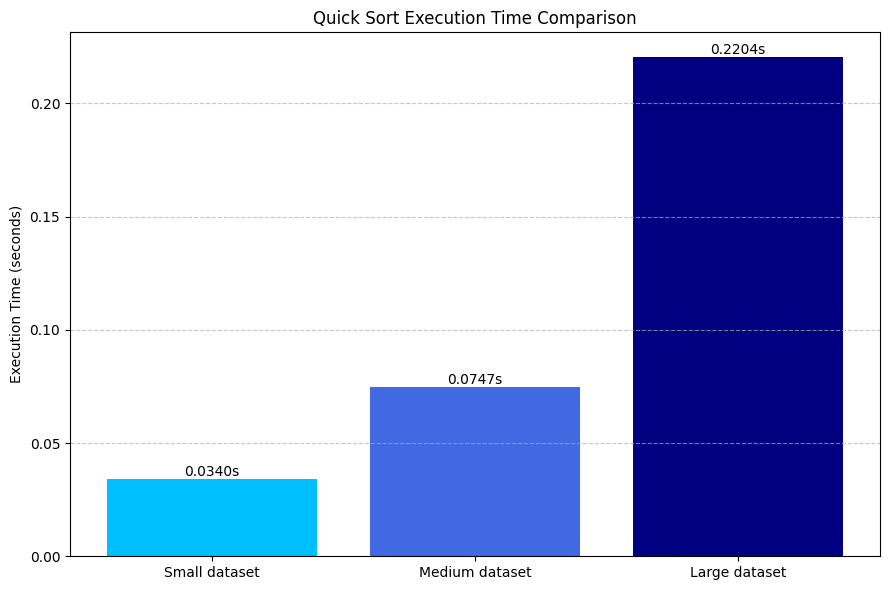

In [277]:
print(f"Quick Sort Time (small): {execution_time_quick_sort_small:.6f} seconds")
print(f"Quick Sort Time (medium): {execution_time_quick_sort_medium:.6f} seconds")
print(f"Quick Sort Time (large): {execution_time_quick_sort_large:.6f} seconds")

# Call the function to plot the chart
plot_quick_sort_chart(execution_time_quick_sort_small, execution_time_quick_sort_medium, execution_time_quick_sort_large)

# Show the chart
plt.show()


Small Dataset - Execution Times:
- Bubble Sort: 66.960478 seconds
- Merge Sort: 0.067480 seconds
- Quick Sort: 0.033977 seconds


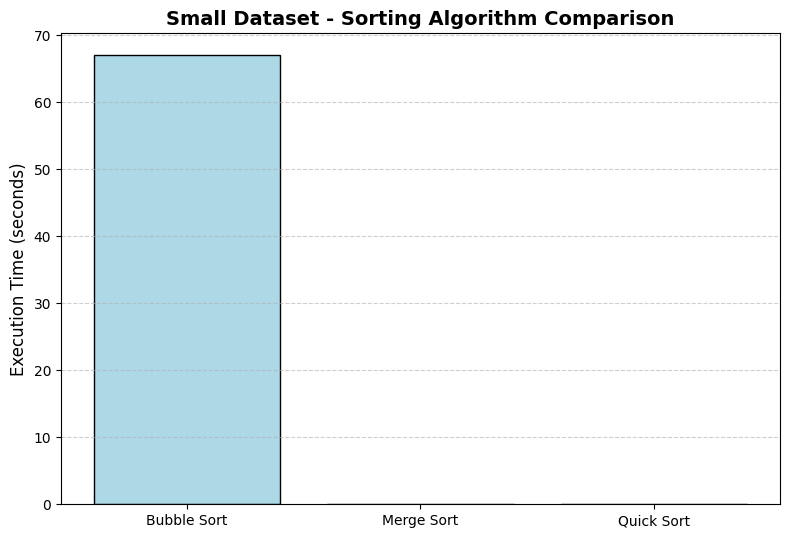

Medium Dataset - Execution Times:
- Bubble Sort: 271.303793 seconds
- Merge Sort: 0.147013 seconds
- Quick Sort: 0.074734 seconds


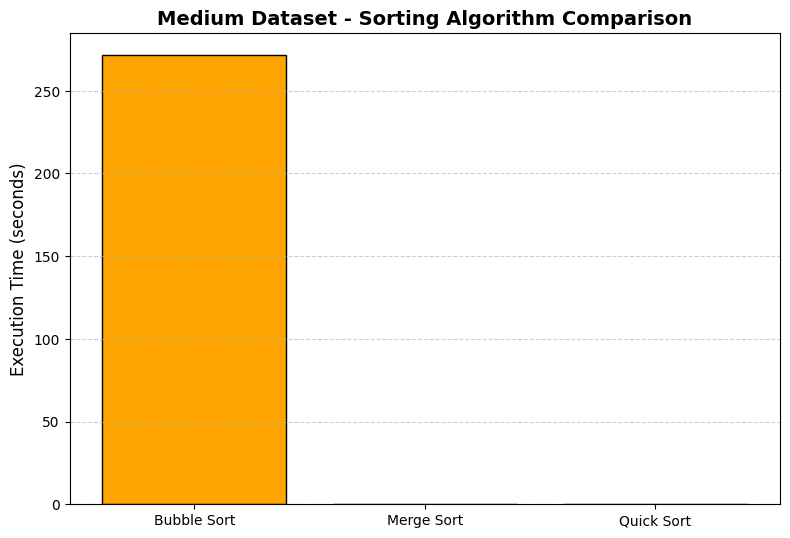

Large Dataset - Execution Times:
- Bubble Sort: 28237.586719 seconds
- Merge Sort: 0.546510 seconds
- Quick Sort: 0.220377 seconds


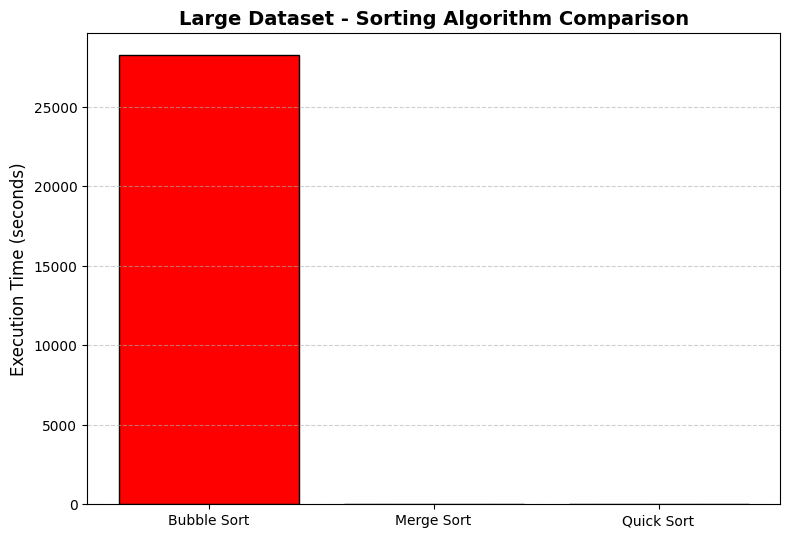

In [212]:
import matplotlib.pyplot as plt

def plot_comparison_for_size(dataset_label, times, colors):
    
    labels = list(times.keys())
    values = list(times.values())

    # Print execution times
    print(f"{dataset_label} Dataset - Execution Times:")
    for label, time_val in zip(labels, values):
        print(f"- {label}: {time_val:.6f} seconds")

    # Create the plot
    plt.figure(figsize=(8, 6))
    bars = plt.bar(labels, values, color=colors, edgecolor='black')

    # Styling
    plt.title(f"{dataset_label} Dataset - Sorting Algorithm Comparison", fontsize=14, fontweight='bold')
    plt.ylabel("Execution Time (seconds)", fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.6)

    # Adjust layout to avoid overlap with the title
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)  # Adjust this to create more space for the title

    plt.show()


# Example usage with dummy values (replace with your real ones)

# Plot comparisons
plot_comparison_for_size("Small", {
    "Bubble Sort": execution_time_bubble_sort_small,
    "Merge Sort": execution_time_merge_sort_small,
    "Quick Sort": execution_time_quick_sort_small
}, colors=['lightblue', 'lightgreen', 'deepskyblue'])

plot_comparison_for_size("Medium", {
    "Bubble Sort": execution_time_bubble_sort_medium,
    "Merge Sort": execution_time_merge_sort_medium,
    "Quick Sort": execution_time_quick_sort_medium
}, colors=['orange', 'mediumseagreen', 'royalblue'])

plot_comparison_for_size("Large", {
    "Bubble Sort": execution_time_bubble_sort_large,
    "Merge Sort": execution_time_merge_sort_large,
    "Quick Sort": execution_time_quick_sort_large
}, colors=['red', 'darkgreen', 'navy'])


This function compares the execution times of different sorting algorithms (Bubble Sort, Merge Sort, Quick Sort) for datasets of various sizes (Small, Medium, Large). It prints the execution times for each algorithm and dataset size, then generates a bar chart for easy visualization. The chart allows us to directly compare the performance of these algorithms and observe how their execution times scale with the size of the dataset.

In [ ]:

TASK 2

part 1

In [21]:
def find_delay_occurencies_linear_search(delay_searched, csv_file):
    array_delay = read_csv(csv_file, 'arr_delay')  # Read the delay column
    array_delay = [float(x) if x.strip() != '' else 0 for x in array_delay]  # Handle empty values
    count = 0

    # Linear search
    for delay in array_delay:
        if delay == delay_searched:
            count += 1

    # Return result
    if count == 0:
        return "No delay found"
    else:
        return f"Delay {delay_searched} occurs {count} times"

This function performs a linear search to count how many times a specific arrival delay appears in the dataset. It reads the delay values, handles empty entries, and returns the total count. Linear search checks each value one by one, so it's simple but not the fastest for large files.

In [226]:
import time

def find_delay_occurencies_with_time_linear(delay_searched, file_path):
    # Measure execution time
    start_time = time.time()
    
    # Call the function to find the frequency of the delay
    delay_occurencies = find_delay_occurencies_linear_search(delay_searched, file_path)
    
    # Calculate execution time
    execution_time = time.time() - start_time
    
    # Return the result and execution time
    return delay_occurencies, execution_time


This function measures the execution time of finding delay occurrences using a linear search. It returns the number of occurrences and the time taken to complete the search.

In [225]:
delay_occurencies_small, execution_time_linear_small = find_delay_occurencies_with_time_linear(10, file_path_fly_small)
delay_occurencies_medium, execution_time_linear_medium = find_delay_occurencies_with_time_linear(10, file_path_fly_medium)
delay_occurencies_large, execution_time_linear_large = find_delay_occurencies_with_time_linear(10, file_path_fly_large)

# Now we can print the results
print(f"Results for Small file: {delay_occurencies_small}, Execution Time: {execution_time_linear_small:.6f} seconds")
print(f"Results for Medium file: {delay_occurencies_medium}, Execution Time: {execution_time_linear_medium:.6f} seconds")
print(f"Results for Large file: {delay_occurencies_large}, Execution Time: {execution_time_linear_large:.6f} seconds")

Results for Small file: Delay 10 occurs 482 times, Execution Time: 0.140579 seconds
Results for Medium file: Delay 10 occurs 960 times, Execution Time: 0.244378 seconds
Results for Large file: Delay 10 occurs 3373 times, Execution Time: 0.744871 seconds


In [236]:
import matplotlib.pyplot as plt

# Function to plot execution times for delay search with linear search
def plot_execution_times(execution_times):
    
    #Plots execution times for different file sizes using a bar chart.
   
    plt.figure(figsize=(8, 5))
    plt.bar(execution_times.keys(), execution_times.values(), color=['skyblue', 'steelblue', 'navy'])

    plt.xlabel("File Size")
    plt.ylabel("Execution Time (seconds)")
    plt.title("Execution Time for Delay Search with Linear Search by File Size")
    
    plt.show()

This function creates a bar chart to visualize the execution times for the delay search with linear search, comparing different file sizes. It takes a dictionary of execution times and plots them with appropriate labels and title.

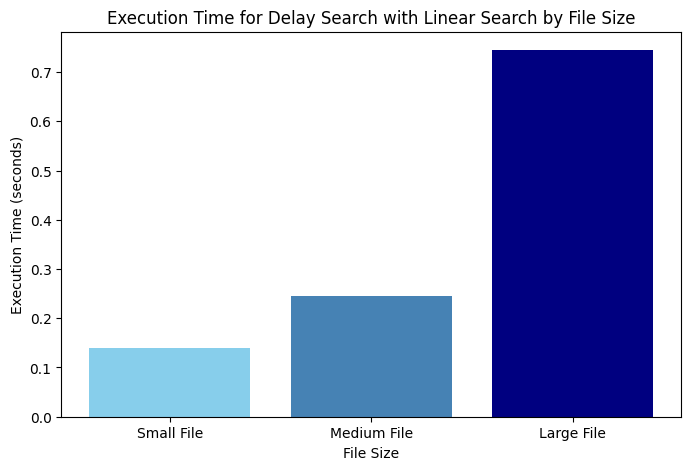

In [237]:
execution_times_delay_search = {
    "Small File": execution_time_linear_small,
    "Medium File": execution_time_linear_medium,
    "Large File": execution_time_linear_large
}

# Call the function to plot the graph
plot_execution_times(execution_times_delay_search)

In [26]:
def find_delay_occurencies_binary_search(delay_searched, csv_file):
    array_delay = read_csv(csv_file, 'arr_delay')
    array_delay = [float(x) if x.strip() != '' else 0 for x in array_delay]
    sorted_array = sorted(array_delay)

    # Find the first index
    left = 0
    right = len(sorted_array) - 1
    first_index = -1
    while left <= right:
        mid = (left + right) // 2
        if sorted_array[mid] == delay_searched:
            first_index = mid
            right = mid - 1  # continue searching to the left
        elif sorted_array[mid] < delay_searched:
            left = mid + 1
        else:
            right = mid - 1

    # Find the last index
    left = 0
    right = len(sorted_array) - 1
    last_index = -1
    while left <= right:
        mid = (left + right) // 2
        if sorted_array[mid] == delay_searched:
            last_index = mid
            left = mid + 1  # continue searching to the right
        elif sorted_array[mid] < delay_searched:
            left = mid + 1
        else:
            right = mid - 1

    if first_index == -1 or last_index == -1:
        c = f"No delay of {delay_searched} found"
    else:
        count = last_index - first_index + 1
        c = f"Delay {delay_searched} occurs {count} times"

    return c
            
                
        

This function uses binary search to find how many times a specific delay occurs. It first sorts the delay values and then looks for the first and last position of the value. Binary search is more efficient than linear search, especially on large datasets, with a time complexity of O(log n).

In [248]:
import time

def find_delay_occurencies_with_time_binary(delay_searched, file_path):
    # Measure execution time
    start_time = time.time()
    
    # Call binary search function
    delay_occurencies = find_delay_occurencies_binary_search(delay_searched, file_path)
    
    # Calculate execution time
    execution_time = time.time() - start_time
    
    # Return result and execution time
    return delay_occurencies, execution_time




This function measures the time taken to find delay occurrences using binary search and returns the result along with the execution time.

In [249]:
delay_occurencies_binary_small, execution_time_binary_small = find_delay_occurencies_with_time_binary(10, file_path_fly_small)
delay_occurencies_binary_medium, execution_time_binary_medium = find_delay_occurencies_with_time_binary(10, file_path_fly_medium)
delay_occurencies_binary_large, execution_time_binary_large = find_delay_occurencies_with_time_binary(10, file_path_fly_large)

# Print results
print(f"Results for Small file (Binary Search): {delay_occurencies_binary_small}, Execution Time: {execution_time_binary_small:.6f} seconds")
print(f"Results for Medium file (Binary Search): {delay_occurencies_binary_medium}, Execution Time: {execution_time_binary_medium:.6f} seconds")
print(f"Results for Large file (Binary Search): {delay_occurencies_binary_large}, Execution Time: {execution_time_binary_large:.6f} seconds")

Results for Small file (Binary Search): Delay 10 occurs 482 times, Execution Time: 0.187093 seconds
Results for Medium file (Binary Search): Delay 10 occurs 960 times, Execution Time: 0.222925 seconds
Results for Large file (Binary Search): Delay 10 occurs 3373 times, Execution Time: 0.742300 seconds


In [239]:
import matplotlib.pyplot as plt

# Function to plot execution times for binary search with different file sizes
def plot_binary_search_execution_times(execution_times):
    
    #Plots execution times for different file sizes using a bar chart.

    
    plt.figure(figsize=(8, 5))
    plt.bar(execution_times.keys(), execution_times.values(),
            color=['lightgreen', 'mediumseagreen', 'seagreen'])

    plt.xlabel("File Size")
    plt.ylabel("Execution Time (seconds)")
    plt.title("Execution Time for Delay Search with Binary Search by File Size")
    
    plt.show()

This function creates a bar chart to compare execution times for binary search across different file sizes, using a green color palette for clarity.

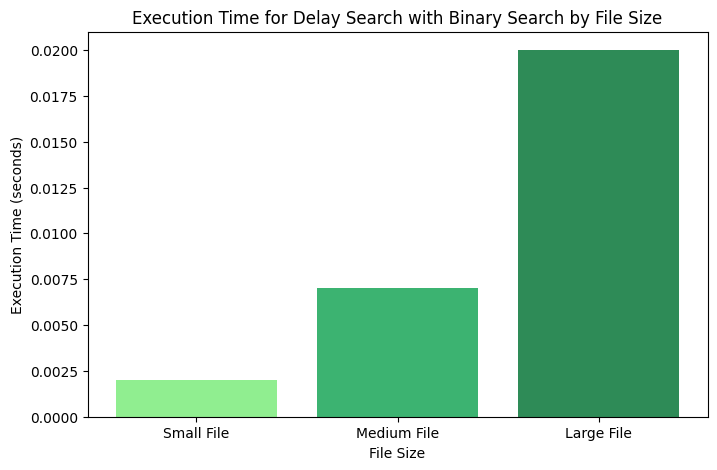

In [242]:
execution_times_binary_search = {
    "Small File": execution_time_binary_small,
    "Medium File": execution_time_binary_medium,
    "Large File": execution_time_binary_large
}

# Call the function to plot the graph
plot_binary_search_execution_times(execution_times_binary_search)

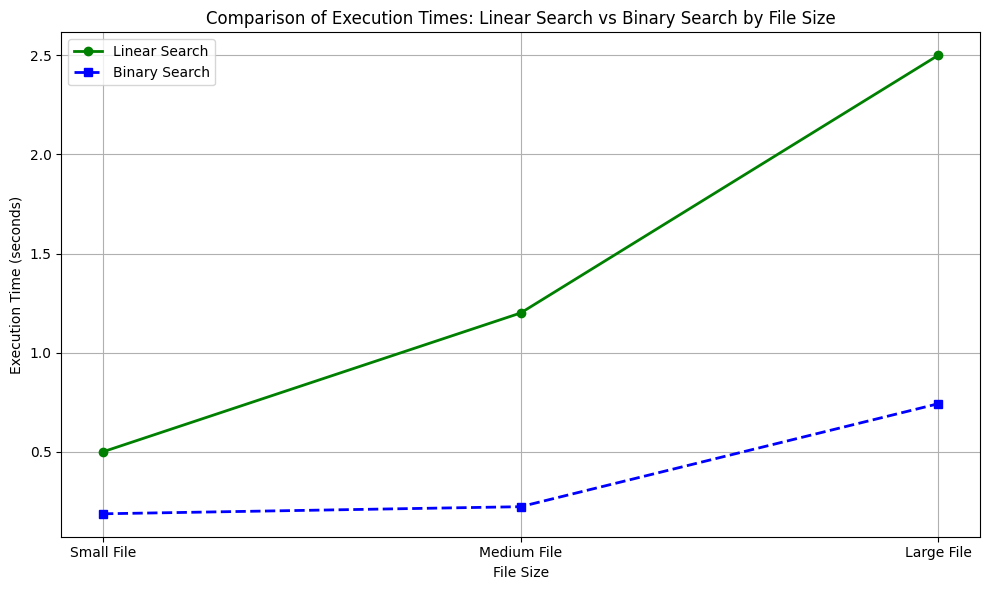

In [328]:
import matplotlib.pyplot as plt

# Function to plot comparison of execution times for Linear and Binary Search using lines
def plot_comparison_line_chart(execution_times_linear, execution_times_binary):
    
    # Extract file sizes (keys) and execution times (values) for both searches
    file_sizes = list(execution_times_linear.keys())
    linear_times = list(execution_times_linear.values())
    binary_times = list(execution_times_binary.values())

    # Create the line chart
    plt.figure(figsize=(10, 6))

    # Plotting both Linear Search and Binary Search execution times
    plt.plot(file_sizes, linear_times, marker='o', label='Linear Search', color='green', linestyle='-', linewidth=2)
    plt.plot(file_sizes, binary_times, marker='s', label='Binary Search', color='blue', linestyle='--', linewidth=2)

    # Add labels, title, and legend
    plt.xlabel('File Size')
    plt.ylabel('Execution Time (seconds)')
    plt.title('Comparison of Execution Times: Linear Search vs Binary Search by File Size')
    plt.legend()

    # Display the plot
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Example data (replace these with your actual execution times)


# Execution times for both searches
execution_times_linear_search = {
    "Small File": execution_time_linear_small,
    "Medium File": execution_time_linear_medium,
    "Large File": execution_time_linear_large
}

execution_times_binary_search = {
    "Small File": execution_time_binary_small,
    "Medium File": execution_time_binary_medium,
    "Large File": execution_time_binary_large
}
plot_comparison_line_chart(execution_times_linear_search, execution_times_binary_search)


This function generates a line chart to compare the execution times of Linear and Binary Search across different file sizes, highlighting the performance difference with distinct markers and line styles.

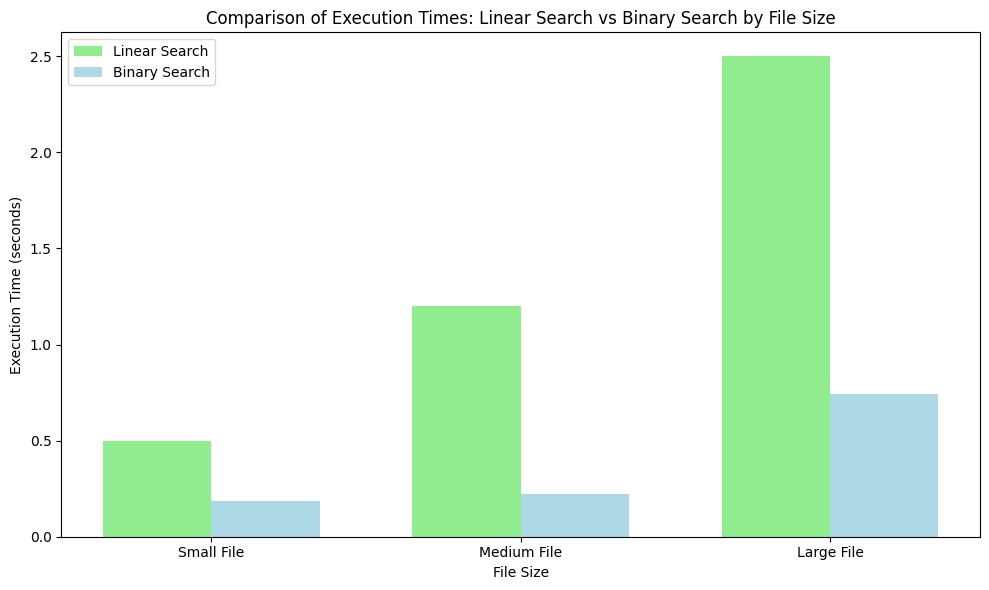

In [251]:
import matplotlib.pyplot as plt
import numpy as np

# Function to plot comparison of execution times for Linear and Binary Search
def plot_comparison(execution_times_linear, execution_times_binary):
    
    # Extract the file sizes and corresponding execution times
    file_sizes = list(execution_times_linear.keys())
    linear_times = list(execution_times_linear.values())
    binary_times = list(execution_times_binary.values())

    # Set the positions of the bars for Linear and Binary search
    x = np.arange(len(file_sizes))  # The label locations
    width = 0.35  # The width of the bars

    # Create the bar chart
    fig, ax = plt.subplots(figsize=(10, 6))

    ax.bar(x - width/2, linear_times, width, label='Linear Search', color='lightgreen')
    ax.bar(x + width/2, binary_times, width, label='Binary Search', color='lightblue')

    # Add labels, title and custom x-axis tick labels
    ax.set_xlabel('File Size')
    ax.set_ylabel('Execution Time (seconds)')
    ax.set_title('Comparison of Execution Times: Linear Search vs Binary Search by File Size')
    ax.set_xticks(x)
    ax.set_xticklabels(file_sizes)
    ax.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()

# Example data (replace these with your actual execution times)

# Execution times for both searches
execution_times_linear_search = {
    "Small File": execution_time_linear_small,
    "Medium File": execution_time_linear_medium,
    "Large File": execution_time_linear_large
}

execution_times_binary_search = {
    "Small File": execution_time_binary_small,
    "Medium File": execution_time_binary_medium,
    "Large File": execution_time_binary_large
}

# Call the function to compare execution times
plot_comparison(execution_times_linear_search, execution_times_binary_search)

This function instead function creates a bar chart to compare Linear and Binary Search execution times, allowing for a side-by-side comparison using two distinct color bars for each file size.

TASK 2 PART 2

In [329]:
class BSTNode:
    def __init__(self, key):
        self.key = key        # (origin, dest) route
        self.count = 1        # Frequency of the route occurrence
        self.left = None      # Left child node
        self.right = None     # Right child node

    # Method to insert a new key or increment the frequency if the key already exists
    def insert(self, key):
        if key == self.key:
            self.count += 1  # Increment count if the route is the same
        elif key < self.key:
            if self.left is None:
                self.left = BSTNode(key)  # Insert as left child if the key is smaller
            else:
                self.left.insert(key)    # Recursively insert in left subtree
        else:
            if self.right is None:
                self.right = BSTNode(key)  # Insert as right child if the key is larger
            else:
                self.right.insert(key)    # Recursively insert in right subtree

    # Method to find the most frequent route in the tree
    def find_most_frequent(self):
        max_key, max_count = self.key, self.count  # Initialize with current node's key

        # Check left subtree for more frequent routes
        if self.left:
            left_key, left_count = self.left.find_most_frequent()
            if left_count > max_count:
                max_key, max_count = left_key, left_count

        # Check right subtree for more frequent routes
        if self.right:
            right_key, right_count = self.right.find_most_frequent()
            if right_count > max_count:
                max_key, max_count = right_key, right_count

        return max_key, max_count  # Return the route with the highest frequency

# Define the FlightRouteBST class that manages the BST
class FlightRouteBST:
    def __init__(self):
        self.root = None  # Root of the BST, initially set to None

    # Method to build the tree from a list of origins and destinations
    def build_from_data(self, origin_list, dest_list):
        for o, d in zip(origin_list, dest_list):  # Iterate over paired origins and destinations
            key = (o, d)  # Create a tuple key for the route (origin, destination)
            if self.root is None:
                self.root = BSTNode(key)  # Create the root node if the tree is empty
            else:
                self.root.insert(key)  # Insert route into the tree

    # Method to find the most frequent route in the tree
    def most_frequent_route(self):
        if self.root is None:
            return None, 0  # Return None if tree is empty
        return self.root.find_most_frequent()  # Call the recursive function to find the most frequent route


The BSTNode class stores a route and its frequency, with methods to insert routes and find the most frequent one. The FlightRouteBST class builds the tree from origin-destination pairs and finds the most frequent route.

In [57]:
def most_frequent_route_linear(origin, dest):
    max_route = None
    max_count = 0
    for i, route in enumerate(zip(origin, dest)):
        count = 1
        for j in range(i + 1, len(origin)):
            if route == (origin[j], dest[j]):
                count += 1
        if count > max_count:
            max_count = count
            max_route = route
    return max_route, max_count


The most_frequent_route_linear function counts the occurrences of each route and returns the most frequent one. It compares each route to the rest and updates the result if a higher frequency is found.

In [58]:
def most_frequent_route_dict(origin, dest):
    route_counts = {}
    for o, d in zip(origin, dest):
        key = (o, d)
        route_counts[key] = route_counts.get(key, 0) + 1
    most_common = max(route_counts.items(), key=lambda x: x[1])
    return most_common[0], most_common[1]


The most_frequent_route_dict function counts the frequency of each route using a dictionary. It then returns the route with the highest count by finding the maximum value in the dictionary.

In [59]:
def most_frequent_route_binary_search(origin, dest):
    routes = sorted(zip(origin, dest))
    current = None
    max_count = 0
    i = 0
    while i < len(routes):
        count = 1
        while i + 1 < len(routes) and routes[i] == routes[i + 1]:
            i += 1
            count += 1
        if count > max_count:
            max_count = count
            current = routes[i]
        i += 1
    return current, max_count

The most_frequent_route_binary_search function sorts the routes and then uses a linear scan to count occurrences of each route. It keeps track of the route with the highest count and returns it along with its frequency.

In [72]:
def analyze_flight_method(method, csv_file, file_path_airport):
    start_time = time.time()

    # Read all data
    origin = [x.strip() for x in read_csv(csv_file, 'origin')]
    dest = [x.strip() for x in read_csv(csv_file, 'dest')]
    City = read_csv(file_path_airport, 'City')
    IATA = [x.strip() for x in read_csv(file_path_airport, 'IATA')]
    companies = read_csv(csv_file, 'name')
    dep_delay = read_csv(csv_file, 'dep_delay')
    arr_delay = read_csv(csv_file, 'arr_delay')

    # Clean delays
    dep_delay = [float(x.strip()) if x.strip() else 0 for x in dep_delay]
    arr_delay = [float(x.strip()) if x.strip() else 0 for x in arr_delay]
    dep_delay = [max(0, x) for x in dep_delay]
    arr_delay = [max(0, x) for x in arr_delay]

    # Find most frequent flight
    if method == "bst":
        bst = FlightRouteBST()
        bst.build_from_data(origin, dest)
        most_common_flight = bst.most_frequent_route()
    elif method == 'linear':
        most_common_flight = most_frequent_route_linear(origin, dest)
    elif method == 'dict':
        most_common_flight = most_frequent_route_dict(origin, dest)
    elif method == 'binary':
        most_common_flight = most_frequent_route_binary_search(origin, dest)
    else:
        raise ValueError("Unknown method")

    # Unpack correctly from the tuple structure
    (most_common_flight_tuple, count) = most_common_flight
    origin_code, dest_code = most_common_flight_tuple

    # City name lookup
    citydeparture = City[IATA.index(origin_code)] if origin_code in IATA else origin_code
    cityarrival = City[IATA.index(dest_code)] if dest_code in IATA else dest_code

    # Filter all flights for the most frequent route
    company_list = []
    delay_list = []
    for i in range(len(origin)):
        if origin[i] == origin_code and dest[i] == dest_code:
            company_list.append(companies[i])
            delay_list.append(dep_delay[i] + arr_delay[i])

    # Average delay per company
    unique_companies = []
    avg_delays = []

    for i, company in enumerate(company_list):
        if company not in unique_companies:
            total_delay = sum(delay_list[j] for j in range(len(company_list)) if company_list[j] == company)
            count = sum(1 for j in range(len(company_list)) if company_list[j] == company)
            unique_companies.append(company)
            avg_delays.append(total_delay / count if count else 0)

    # Select best company
    if avg_delays:
        best_index = avg_delays.index(min(avg_delays))
        best_company = unique_companies[best_index]
        result = (f"The best company for the most frequent flight {most_common_flight} "
                  f"(from {citydeparture} to {cityarrival}) is {best_company}, "
                  f"with an average delay of {avg_delays[best_index]:.2f} min")
    else:
        result = f"No companies found for the most frequent flight {most_common_flight}."
        best_company = None

    end_time = time.time()
    execution_time = end_time - start_time

    return result, execution_time

We implemented an algorithm to compare the execution times of four methods for identifying the most frequent flight route: Binary Search Tree (BST), Linear Search, Dictionary, and Binary Search with a sorted list.

Each method calculates the most frequent route and measures execution time. The function analyze_flight_method returns the most frequent route along with the best airline based on average delays, allowing us to compare the performance and efficiency of each approach across different datasets.

In [73]:
result_bst, time_bst = analyze_flight_method("bst", file_path_fly_small, file_path_airport)
print("BST Method:\n", result_bst)
print(f"Execution Time: {time_bst:.5f} seconds\n")

result_linear, time_linear = analyze_flight_method("linear", file_path_fly_small, file_path_airport)
print("Linear Search Method:\n", result_linear)
print(f"Execution Time: {time_linear:.5f} seconds\n")

result_dict, time_dict = analyze_flight_method("dict", file_path_fly_small, file_path_airport)
print("Dictionary Lookup Method:\n", result_dict)
print(f"Execution Time: {time_dict:.5f} seconds\n")

result_binary, time_binary = analyze_flight_method("binary", file_path_fly_small, file_path_airport)
print("Binary Search Method:\n", result_binary)
print(f"Execution Time: {time_binary:.5f} seconds\n")

BST Method:
 The best company for the most frequent flight (('JFK', 'LAX'), 1673) (from New York to Los Angeles) is Delta Air Lines Inc., with an average delay of 17.72 min
Execution Time: 0.60710 seconds

Linear Search Method:
 The best company for the most frequent flight (('JFK', 'LAX'), 1673) (from New York to Los Angeles) is Delta Air Lines Inc., with an average delay of 17.72 min
Execution Time: 61.89046 seconds

Dictionary Lookup Method:
 The best company for the most frequent flight (('JFK', 'LAX'), 1673) (from New York to Los Angeles) is Delta Air Lines Inc., with an average delay of 17.72 min
Execution Time: 0.54148 seconds

Binary Search Method:
 The best company for the most frequent flight (('JFK', 'LAX'), 1673) (from New York to Los Angeles) is Delta Air Lines Inc., with an average delay of 17.72 min
Execution Time: 0.55491 seconds



The method with the smallest execution time is: Dictionary Lookup with 0.541481 seconds


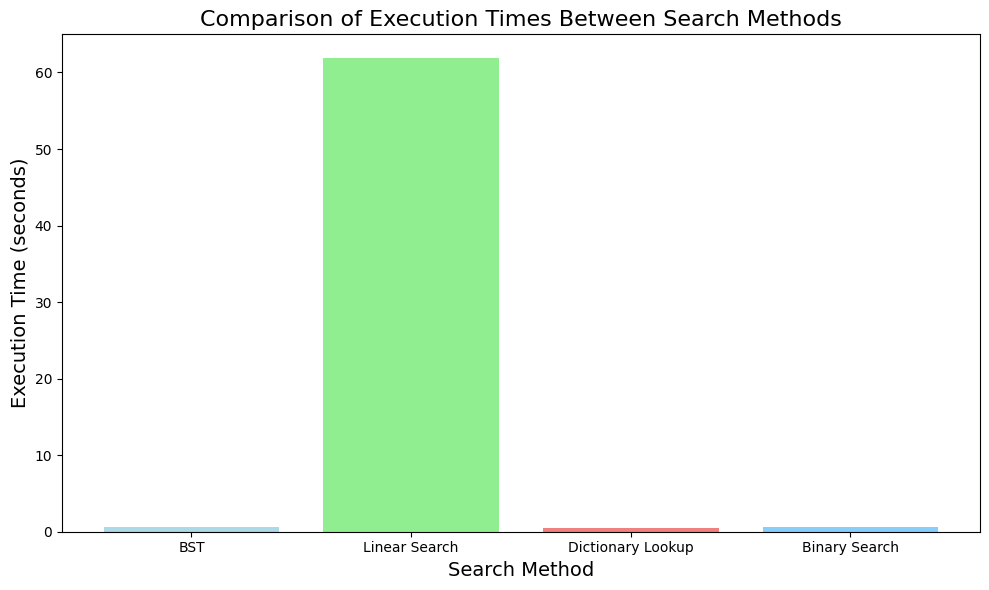

In [332]:
import matplotlib.pyplot as plt

# Example data (replace these with your actual results)
methods = ['BST', 'Linear Search', 'Dictionary Lookup', 'Binary Search']
times = [time_bst, time_linear, time_dict, time_binary]  # Replace with your actual times

# Find the method with the smallest execution time
min_time = min(times)
min_method = methods[times.index(min_time)]

# Print the method with the smallest execution time
print(f"The method with the smallest execution time is: {min_method} with {min_time:.6f} seconds")

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(methods, times, color=['lightblue', 'lightgreen', 'lightcoral', 'lightskyblue'])

# Add titles and labels
plt.title('Comparison of Execution Times Between Search Methods', fontsize=16)
plt.xlabel('Search Method', fontsize=14)
plt.ylabel('Execution Time (seconds)', fontsize=14)
plt.tight_layout()

# Display the chart
plt.show()

This code creates a bar chart comparing the execution times of four search methods: BST, Linear Search, Dictionary Lookup, and Binary Search. It helps visualize performance differences between the methods.

In [330]:
import networkx as nx
import matplotlib.pyplot as plt

def build_graph_from_bst(node, graph=None, parent=None, labels=None):
    if graph is None:
        graph = nx.DiGraph()
        labels = {}
    if node:
        node_id = f"{node.key}\n({node.count})"
        graph.add_node(node_id)
        labels[node_id] = node_id
        if parent:
            graph.add_edge(parent, node_id)
        build_graph_from_bst(node.left, graph, node_id, labels)
        build_graph_from_bst(node.right, graph, node_id, labels)
    return graph, labels

def hierarchy_pos(G, root=None, width=10.0, vert_gap=0.8, vert_loc=0, xcenter=0.5, pos=None, parent=None):
    """
    Custom tree layout: larger width and vert_gap for more spacing.
    """
    if pos is None:
        pos = {}
    children = list(G.successors(root))
    if len(children) != 0:
        dx = width / len(children)
        nextx = xcenter - width / 2 - dx / 2
        for child in children:
            nextx += dx
            pos = hierarchy_pos(G, root=child, width=dx, vert_gap=vert_gap,
                                vert_loc=vert_loc - vert_gap, xcenter=nextx, pos=pos, parent=root)
    pos[root] = (xcenter, vert_loc)
    return pos

def plot_bst_graph(bst):
    if bst.root is None:
        print("BST is empty.")
        return

    G, labels = build_graph_from_bst(bst.root)
    root_label = list(G.nodes)[0]
    pos = hierarchy_pos(G, root=root_label, width=12.0, vert_gap=1.2)

    plt.figure(figsize=(20, 12))  # Big figure for more spacing
    nx.draw(G, pos, labels=labels, with_labels=True, node_color='lightsteelblue',
            node_size=3000, font_size=10, font_weight='bold', arrows=True, edgecolors='black')
    plt.title("BST Structure of Flight Routes", fontsize=18, fontweight='bold')
    plt.show()

This code builds and visualizes a Binary Search Tree (BST) of flight routes. It converts the BST into a graph and plots it hierarchically using networkx and matplotlib, showing routes and their frequencies.

Most frequent route: ('JFK', 'LAX') with 1673 occurrences


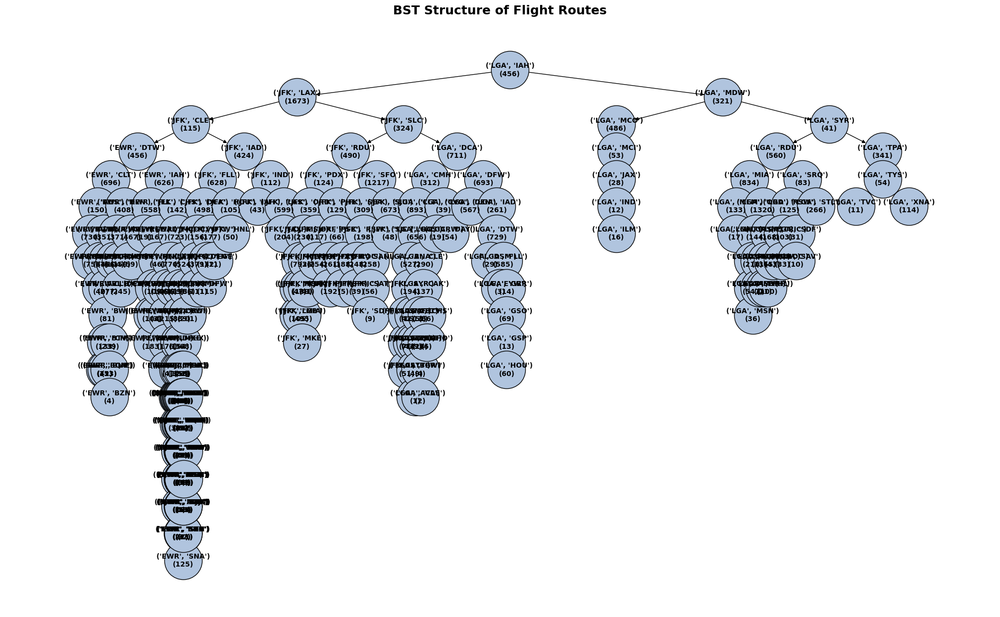

In [331]:
bst = FlightRouteBST()
bst.build_from_data(origin, destination)

# print the most frequent flight 
route, count = bst.most_frequent_route()
print(f"Most frequent route: {route} with {count} occurrences")

# visulize the bts 
plot_bst_graph(bst)

TASK 3

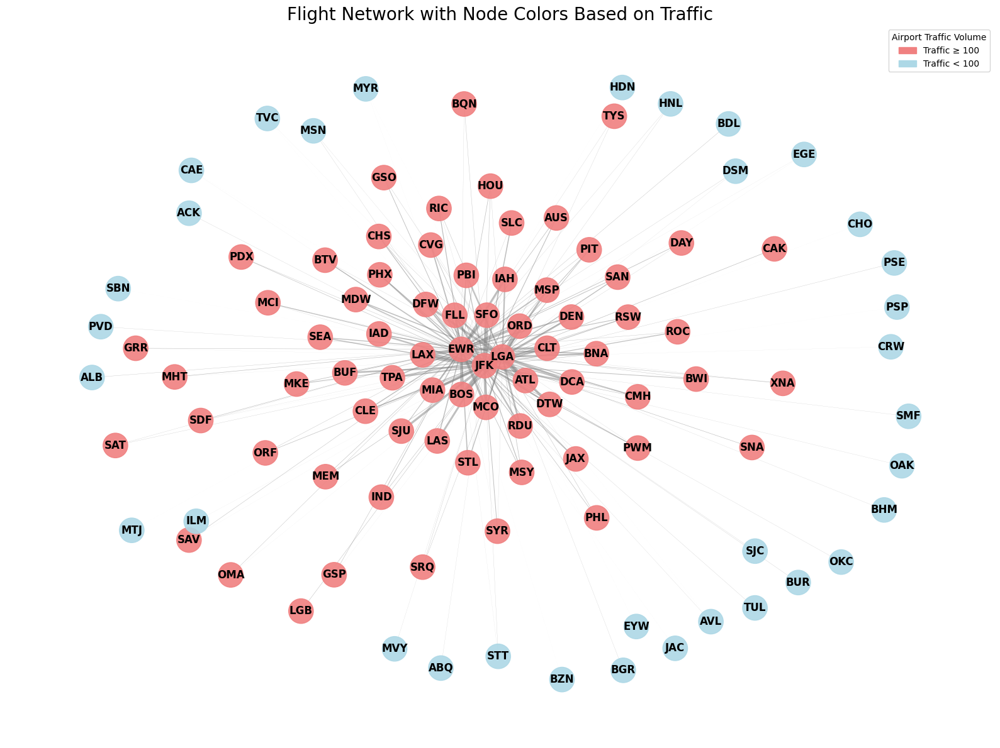

IATA codes in the graph: ['IAH', 'LGA', 'JFK', 'LAX', 'SLC', 'MDW', 'DCA', 'CLE', 'DFW', 'SYR', 'DTW', 'EWR', 'CHS', 'MCO', 'RDU', 'CLT', 'IAD', 'DEN', 'SRQ', 'CMH', 'BUF', 'PDX', 'BTV', 'SFO', 'PHL', 'PSE', 'ORD', 'CVG', 'MKE', 'BOS', 'IND', 'BNA', 'MIA', 'FLL', 'PHX', 'TUL', 'SEA', 'AUS', 'MSY', 'LAS', 'MSP', 'STL', 'ATL', 'PIT', 'BWI', 'MCI', 'SAN', 'PWM', 'RSW', 'SAV', 'TPA', 'MEM', 'JAX', 'PBI', 'LGB', 'ORF', 'CAK', 'HOU', 'BUR', 'ROC', 'HNL', 'SJU', 'MHT', 'BDL', 'ALB', 'MVY', 'SAT', 'SMF', 'RIC', 'BQN', 'OAK', 'SJC', 'GSP', 'DAY', 'SDF', 'SNA', 'GRR', 'BHM', 'TYS', 'MSN', 'GSO', 'DSM', 'CAE', 'OMA', 'PVD', 'BGR', 'STT', 'AVL', 'XNA', 'OKC', 'ABQ', 'EGE', 'ACK', 'CRW', 'EYW', 'TVC', 'PSP', 'ILM', 'HDN', 'CHO', 'JAC', 'MYR', 'BZN', 'SBN', 'MTJ']


In [91]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter
import matplotlib.patches as mpatches

# Read origin and destination columns
origin = read_csv(file_path_fly_small, 'origin')
destination = read_csv(file_path_fly_small, 'dest')

# Count the number of flights between airport pairs (undirected)
routes = [(o, d) if o <= d else (d, o) for o, d in zip(origin, destination)]
flight_counts = Counter(routes)

# Create the graph
G = nx.Graph()
for (o, d), count in flight_counts.items():
    G.add_edge(o, d, weight=count)

# Compute layout for nodes
pos = nx.spring_layout(G, seed=42, k=3.0)

# Compute total traffic per airport (weighted degree)
node_traffic = dict(G.degree(weight='weight'))

# Set traffic threshold to distinguish node colors
threshold = 100  # You can adjust this value

# Assign colors based on traffic volume
node_colors = []
for node in G.nodes():
    if node_traffic[node] >= threshold:
        node_colors.append('lightcoral')  # High traffic
    else:
        node_colors.append('lightblue')   # Low traffic

# Plot the graph
plt.figure(figsize=(16, 12))
nx.draw_networkx_nodes(G, pos, node_size=800, node_color=node_colors, alpha=0.9)
nx.draw_networkx_labels(G, pos, font_size=12, font_weight='bold')

# Draw edges with thickness proportional to the number of flights
edges = G.edges(data=True)
max_weight = max(d['weight'] for (_, _, d) in edges)
widths = [d['weight'] / max_weight * 6 for (_, _, d) in edges]
nx.draw_networkx_edges(G, pos, width=widths, edge_color='gray', alpha=0.5)

# Add a custom legend
high_patch = mpatches.Patch(color='lightcoral', label=f'Traffic ≥ {threshold}')
low_patch = mpatches.Patch(color='lightblue', label=f'Traffic < {threshold}')
plt.legend(handles=[high_patch, low_patch], title="Airport Traffic Volume")

# Final touches
plt.title("Flight Network with Node Colors Based on Traffic", fontsize=20)
plt.axis('off')
plt.tight_layout()
plt.show()

# Create a list of all IATA codes (airport codes) in the graph
iata_codes = list(G.nodes())
print("IATA codes in the graph:", iata_codes)


This code visualizes a flight network using networkx, where airports are represented as nodes and flight routes as edges. It distinguishes airports with high and low traffic by color-coding the nodes and adjusting edge thickness based on the number of flights between airports. The network is displayed with a custom legend, showing traffic volume thresholds.

In [323]:
iata_codes
iata= read_csv(file_path_airport,"IATA")
city=read_csv(file_path_airport,"City")
cities=[]
index=0 
for iat in iata:
    if iat in iata_codes:
        cities.append(city[index])
    index += 1
print(cities)
    
city_coordinates = {'Houston': (29.7604, -95.3698), 'New York': (40.7128, -74.0060), 'Los Angeles': (34.0522, -118.2437), 'Salt Lake City': (40.7608, -111.8910), 'Chicago': (41.8781, -87.6298), 'Washington, D.C.': (38.9072, -77.0369), 'Cleveland': (41.4993, -81.6944), 'Dallas': (32.7767, -96.7970), 'Syracuse': (43.0481, -76.1474), 'Detroit': (42.3314, -83.0458), 'Newark': (40.7357, -74.1724), 'Charleston': (32.7765, -79.9311), 'Orlando': (28.5383, -81.3792), 'Raleigh': (35.7796, -78.6382), 'Charlotte': (35.2271, -80.8431), 'Denver': (39.7392, -104.9903), 'Sarasota': (27.3382, -82.5307), 'Columbus': (39.9612, -82.9988), 'Buffalo': (42.8864, -78.8784), 'Portland': (45.5152, -122.6784), 'Burlington': (44.4759, -73.2121), 'San Francisco': (37.7749, -122.4194), 'Philadelphia': (39.9526, -75.1652), 'Ponce': (17.9792, -66.9505), 'Cincinnati': (39.1031, -84.5120), 'Milwaukee': (43.0389, -87.9065), 'Boston': (42.3601, -71.0589), 'Indianapolis': (39.7684, -86.1580), 'Nashville': (36.1627, -86.7816), 'Miami': (25.7617, -80.1918), 'Fort Lauderdale': (26.1223, -80.1434), 'Phoenix': (33.4484, -112.0740), 'Tulsa': (36.1539, -95.9928), 'Seattle': (47.6062, -122.3321), 'Austin': (30.2672, -97.7431), 'New Orleans': (29.7604, -90.0715), 'Las Vegas': (36.1699, -115.1398), 'Minneapolis': (44.9778, -93.2650), 'St. Louis': (38.6270, -90.1994), 'Atlanta': (33.7490, -84.3880), 'Pittsburgh': (40.4406, -79.9959), 'Baltimore': (39.2904, -76.6122), 'Kansas City': (39.0997, -94.5786), 'San Diego': (32.7157, -117.1611), 'Portland': (43.6615, -70.2553), 'Fort Myers': (26.6406, -81.8723), 'Savannah': (32.0809, -81.0912), 'Tampa': (27.9506, -82.4572), 'Memphis': (35.1495, -90.0490), 'Jacksonville': (30.3322, -81.6556), 'West Palm Beach': (26.7153, -80.0534), 'Long Beach': (33.7683, -118.1957), 'Norfolk': (36.8508, -76.2859), 'Akron': (41.0814, -81.5190), 'Burbank': (34.1808, -118.3080), 'Rochester': (43.1610, -77.6109), 'Honolulu': (21.3069, -157.8583), 'San Juan': (18.4655, -66.1057), 'Manchester': (42.9956, -71.4548), 'Hartford': (41.7658, -72.6734), 'Albany': (42.6526, -73.7562), 'Martha\'s Vineyard': (41.3833, -70.5333), 'San Antonio': (29.4241, -98.4936), 'Sacramento': (38.5816, -121.4944), 'Richmond': (37.5407, -77.4360), 'Aguadilla': (18.4196, -67.1588), 'Oakland': (37.8044, -122.2711), 'San Jose': (37.3382, -121.8863), 'Greenville': (34.8526, -82.3940), 'Dayton': (39.7589, -84.1916), 'Louisville': (38.2527, -85.7585), 'Santa Ana': (33.7455, -117.8677), 'Grand Rapids': (42.9634, -85.6681), 'Birmingham': (33.5186, -86.8104), 'Knoxville': (35.9606, -83.9207), 'Madison': (43.0731, -89.4012), 'Greensboro': (36.0726, -79.7910), 'Des Moines': (41.5868, -93.6250), 'Columbia': (34.0007, -81.0348), 'Omaha': (41.2524, -95.9980), 'Providence': (41.8236, -71.4222), 'Bangor': (44.8012, -68.7778), 'St. Thomas': (18.3419, -64.9307), 'Asheville': (35.5951, -82.5515), 'Fayetteville': (36.0822, -94.1718), 'Oklahoma City': (35.4676, -97.5164), 'Albuquerque': (35.0844, -106.6504), 'Eagle': (39.6406, -106.6223), 'Nantucket': (41.2835, -70.0995), 'Charleston': (38.3498, -81.6326), 'Key West': (24.5551, -81.7800), 'Traverse City': (44.7631, -85.6206), 'Palm Springs': (33.8303, -116.5453), 'Wilmington': (34.2257, -77.9447), 'Hayden': (40.5121, -107.2107), 'Charlottesville': (38.0293, -78.4767), 'Jackson': (42.7450, -110.7624), 'Myrtle Beach': (33.6891, -78.8867), 'Bozeman': (45.6760, -111.0443), 'South Bend': (41.6764, -86.2510), 'Montrose': (38.4783, -107.8762)}


['Akron', 'Albany', 'Albuquerque', 'Asheville', 'Atlanta', 'Austin', 'Baltimore', 'Bangor', 'Birmingham', 'Boston', 'Bozeman', 'Buffalo', 'Burbank', 'Burlington', 'Charleston', 'Charleston', 'Charlotte', 'Charlottesville', 'Chicago', 'Chicago', 'Cincinnati', 'Cleveland', 'Columbia', 'Columbus', 'Dallas', 'Dayton', 'Denver', 'Des Moines', 'Detroit', 'Fayetteville', 'Fort Lauderdale', 'Fort Myers', 'Grand Rapids', 'Greensboro', 'Greenville', 'Hartford', 'Honolulu, Oahu', 'Houston', 'Houston', 'Indianapolis', 'Jackson Hole', 'Jacksonville', 'Kansas City', 'Key West', 'Knoxville', 'Las Vegas', 'Long Beach', 'Los Angeles', 'Louisville', 'Madison', 'Manchester', "Martha's Vineyard", 'Memphis', 'Miami', 'Milwaukee', 'Minneapolis', 'Montrose', 'Myrtle Beach', 'Nantucket', 'Nashville', 'New Orleans', 'New York', 'New York', 'Newark', 'Norfolk', 'Oakland', 'Oklahoma City', 'Omaha', 'Orange County', 'Orlando', 'Palm Springs', 'Philadelphia', 'Phoenix', 'Pittsburgh', 'Portland', 'Portland', 'Provi

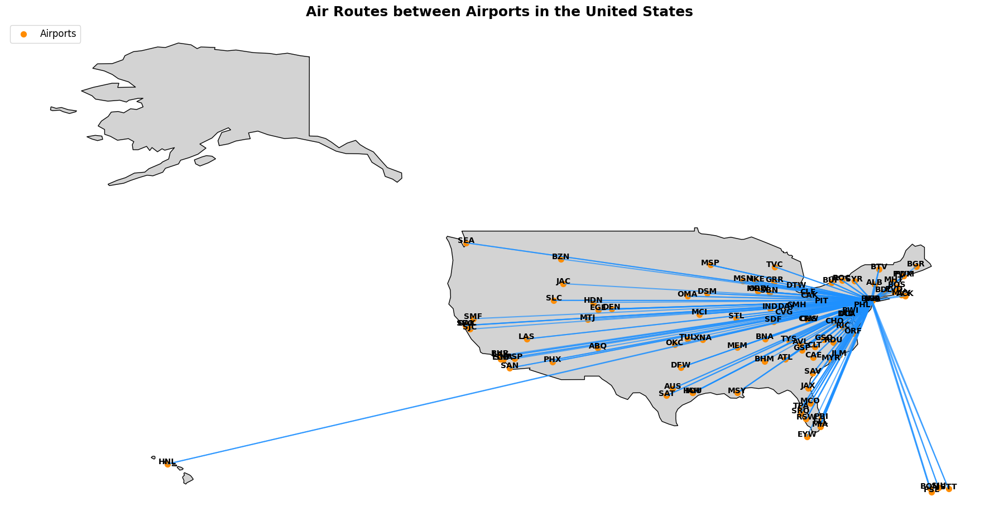

In [321]:
import zipfile
import os
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString
import networkx as nx

# Path to the ZIP file containing the shapefile
zip_file_path = '/Users/micheleelia/Documents/group s _task_1_Algorithms_project_zip/110m_cultural.dbf.zip'
extract_folder = 'path_to_extracted_folder/'

# Extract the content of the ZIP file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder)

# Load the extracted shapefile
shapefile_path = os.path.join(extract_folder, 'ne_110m_admin_0_countries.shp')
world = gpd.read_file(shapefile_path)

# Filter out the United States (including Alaska and Hawaii)
us = world[world['ADMIN'] == 'United States of America']

# Remove Alaska and Hawaii by filtering based on their coordinates or boundaries
# You may adjust the latitude/longitude bounds as necessary
us = us.cx[-125:-66.5, 24.396308:49.384358]  # excluding Alaska and Hawaii

# Function to get airport coordinates based on the airport code
def get_coordinates(airport_code, city_coordinates):
    city_name = iata_codes.get(airport_code)
    return city_coordinates.get(city_name, (None, None))

# Create a GeoDataFrame for the airports
airport_points = []
for airport_code in G.nodes():
    coords = get_coordinates(airport_code, city_coordinates)
    if coords != (None, None):
        airport_points.append(Point(coords[1], coords[0]))  # (longitude, latitude)

gdf_airports = gpd.GeoDataFrame(geometry=airport_points)
gdf_airports['airport_code'] = list(G.nodes())

# Create a GeoDataFrame for the flight routes (LineString)
flight_lines = []
for (o, d), count in flight_counts.items():
    origin_coords = get_coordinates(o, city_coordinates)
    dest_coords = get_coordinates(d, city_coordinates)

    if origin_coords != (None, None) and dest_coords != (None, None):
        line = LineString([Point(origin_coords[1], origin_coords[0]), Point(dest_coords[1], dest_coords[0])])
        flight_lines.append(line)

gdf_flights = gpd.GeoDataFrame(geometry=flight_lines)

# Create the plot
fig, ax = plt.subplots(figsize=(18, 14))

# Plot the map of the United States with a light gray color and black borders
us.plot(ax=ax, color='lightgray', edgecolor='black')

# Add the flight routes in a vibrant color (dodger blue) with thicker lines
gdf_flights.plot(ax=ax, color='dodgerblue', linewidth=1.5, alpha=0.7)

# Add the airports with a distinct color (dark orange) and larger markers
gdf_airports.plot(ax=ax, color='darkorange', markersize=50, label='Airports')

# Add labels for the airports with more readable fonts and better positioning
for idx, row in gdf_airports.iterrows():
    ax.text(row.geometry.x, row.geometry.y, row['airport_code'], fontsize=10, ha='center', color='black', fontweight='bold')

# Add a legend at the upper left corner for clarity
plt.legend(loc='upper left', fontsize=12)

# Title of the map
ax.set_title("Air Routes between Airports in the United States", fontsize=18, fontweight='bold')

# Remove the axes for a cleaner map
plt.axis('off')

# Make the layout more compact
plt.tight_layout()

# Show the map
plt.show()


This code visualizes the air routes between airports in the United States using geographic data. It extracts a shapefile from a ZIP archive and filters the United States. The airports are plotted as points, and flight routes are drawn as lines connecting these points. The map highlights airports in dark orange and flight routes in dodger blue, providing a clear view of the air network. Additionally, the plot includes airport labels, a title, and a legend for better readability.

In [95]:
import networkx as nx

def get_flights_by_airport_from_graph(iata_code, G):
   
    total_flights = 0
    
    # Check all the connections (edges) in the graph
    for neighbor in G.neighbors(iata_code):  # Check all the neighbors of this node
        if G.has_edge(iata_code, neighbor):
            total_flights += G[iata_code][neighbor]['weight']  # Add the weight (number of flights)
    
    return total_flights

# Example usage of the function with a graph G
iata_code = "STT"  # IATA code of the airport to check

# Assuming G is the previously constructed graph
total_flights = get_flights_by_airport_from_graph(iata_code, G)
print(f"Total number of flights passing through airport {iata_code}: {total_flights}")


Total number of flights passing through airport STT: 73


Returns the total number of flights passing through a given airport.

In [83]:
import networkx as nx
import time

# Assuming 'G' is the graph you've already created

# Measure execution time
start_time = time.time()

# Find connected components using NetworkX
components = list(nx.connected_components(G))

end_time = time.time()
execution_time = end_time - start_time

# Print the number of connected components and the components themselves
print(f"Number of connected components: {len(components)}")
for i, comp in enumerate(components):
    print(f"Component {i+1}: {comp}")

# Print execution time
print(f"\nExecution time: {execution_time:.6f} seconds")

Number of connected components: 1
Component 1: {'ACK', 'CHS', 'CLT', 'BOS', 'HOU', 'CHO', 'GRR', 'MTJ', 'ORF', 'SEA', 'LGA', 'MSY', 'BNA', 'RIC', 'BWI', 'BHM', 'JAC', 'SMF', 'MIA', 'RSW', 'MHT', 'CVG', 'ORD', 'JFK', 'ILM', 'MSP', 'EGE', 'SAV', 'CRW', 'SAT', 'MYR', 'PHX', 'SFO', 'MCO', 'AVL', 'RDU', 'IAH', 'DSM', 'LAX', 'ABQ', 'EWR', 'SBN', 'LGB', 'MVY', 'ROC', 'EYW', 'BQN', 'PIT', 'BGR', 'SNA', 'SYR', 'CAE', 'ATL', 'GSP', 'DAY', 'SDF', 'BZN', 'JAX', 'GSO', 'SRQ', 'ALB', 'BUF', 'OKC', 'OMA', 'IND', 'TYS', 'CMH', 'PWM', 'STT', 'SAN', 'PSE', 'SLC', 'XNA', 'PVD', 'MDW', 'FLL', 'CLE', 'TVC', 'PDX', 'STL', 'MEM', 'DCA', 'BDL', 'SJC', 'MKE', 'BUR', 'TUL', 'CAK', 'HNL', 'PBI', 'TPA', 'BTV', 'HDN', 'DFW', 'PSP', 'IAD', 'MCI', 'SJU', 'MSN', 'PHL', 'OAK', 'DTW', 'AUS', 'DEN', 'LAS'}

Execution time: 0.000158 seconds


This code uses NetworkX functions to find the connected components of a graph G and measures the execution time for the operation. It calls nx.connected_components to identify and print the components in the graph.

In [84]:
import time

def dfs(graph, node, visited):
    # Explore all neighbors of the current node
    visited.add(node)
    for neighbor in graph[node]:
        if neighbor not in visited:
            dfs(graph, neighbor, visited)

def find_connected_components_dfs(graph):
    visited = set()
    components = []
    
    # Iterate over all nodes in the graph
    for node in graph:
        if node not in visited:
            # Start a new DFS search from this node
            component = set()
            dfs(graph, node, component)
            components.append(component)
            visited.update(component)
    
    return components

# Convert NetworkX graph to a dictionary
graph_dict = nx.to_dict_of_lists(G)

# Measure execution time for DFS-based connected components
start_time = time.time()

components_dfs = find_connected_components_dfs(graph_dict)

end_time = time.time()
execution_time_dfs = end_time - start_time

# Print the connected components found by DFS
print(f"Number of connected components (DFS): {len(components_dfs)}")
for i, comp in enumerate(components_dfs):
    print(f"Component {i+1}: {comp}")

# Print execution time
print(f"\nExecution time (DFS): {execution_time_dfs:.6f} seconds")

Number of connected components (DFS): 1
Component 1: {'ACK', 'CHS', 'CLT', 'BOS', 'HOU', 'CHO', 'GRR', 'MTJ', 'ORF', 'SEA', 'LGA', 'MSY', 'BWI', 'BNA', 'RIC', 'BHM', 'JAC', 'SMF', 'RSW', 'MIA', 'MHT', 'CVG', 'ORD', 'JFK', 'ILM', 'MSP', 'EGE', 'SAV', 'CRW', 'SAT', 'PHX', 'MYR', 'SFO', 'MCO', 'AVL', 'RDU', 'IAH', 'DSM', 'LAX', 'ABQ', 'EWR', 'SBN', 'LGB', 'MVY', 'ROC', 'EYW', 'BQN', 'PIT', 'BGR', 'SNA', 'SYR', 'CAE', 'ATL', 'GSP', 'DAY', 'SDF', 'BZN', 'JAX', 'GSO', 'SRQ', 'ALB', 'BUF', 'OKC', 'OMA', 'IND', 'TYS', 'CMH', 'PWM', 'STT', 'SAN', 'PSE', 'SLC', 'XNA', 'PVD', 'MDW', 'FLL', 'CLE', 'PDX', 'TVC', 'STL', 'MEM', 'DCA', 'BDL', 'SJC', 'MKE', 'BUR', 'TUL', 'CAK', 'HNL', 'PBI', 'TPA', 'BTV', 'HDN', 'DFW', 'PSP', 'IAD', 'MCI', 'SJU', 'MSN', 'PHL', 'OAK', 'DTW', 'AUS', 'DEN', 'LAS'}

Execution time (DFS): 0.000320 seconds


This code uses DFS to find connected components in a graph. It explores each node recursively, collects components, and measures the execution time. The number of components and the nodes in each are then printed.

In [85]:
import time
from collections import deque

# DFS implementation
def dfs(graph, node, visited):
    visited.add(node)
    for neighbor in graph[node]:
        if neighbor not in visited:
            dfs(graph, neighbor, visited)

def find_connected_components_dfs(graph):
    visited = set()
    components = []
    for node in graph:
        if node not in visited:
            component = set()
            dfs(graph, node, component)
            components.append(component)
            visited.update(component)
    return components

# BFS implementation
def bfs(graph, start_node):
    visited = set()
    queue = deque([start_node])
    component = set()
    visited.add(start_node)

    while queue:
        node = queue.popleft()
        component.add(node)
        for neighbor in graph[node]:
            if neighbor not in visited:
                visited.add(neighbor)
                queue.append(neighbor)

    return component

def find_connected_components_bfs(graph):
    visited = set()
    components = []
    for node in graph:
        if node not in visited:
            component = bfs(graph, node)
            components.append(component)
            visited.update(component)
    return components

# Convert NetworkX graph to dict
graph_dict = nx.to_dict_of_lists(G)

# DFS execution
start_dfs = time.time()
components_dfs = find_connected_components_dfs(graph_dict)
end_dfs = time.time()
dfs_time = end_dfs - start_dfs

# BFS execution
start_bfs = time.time()
components_bfs = find_connected_components_bfs(graph_dict)
end_bfs = time.time()
bfs_time = end_bfs - start_bfs

# Print results
print(f"Connected components (DFS): {len(components_dfs)}")
for i, comp in enumerate(components_dfs):
    print(f"DFS Component {i+1}: {comp}")

print(f"Execution time (DFS): {dfs_time:.6f} seconds\n")

print(f"Connected components (BFS): {len(components_bfs)}")
for i, comp in enumerate(components_bfs):
    print(f"BFS Component {i+1}: {comp}")

print(f"Execution time (BFS): {bfs_time:.6f} seconds")


Connected components (DFS): 1
DFS Component 1: {'ACK', 'CHS', 'CLT', 'BOS', 'HOU', 'CHO', 'GRR', 'MTJ', 'ORF', 'SEA', 'LGA', 'MSY', 'BWI', 'BNA', 'RIC', 'BHM', 'JAC', 'SMF', 'RSW', 'MIA', 'MHT', 'CVG', 'ORD', 'JFK', 'ILM', 'MSP', 'EGE', 'SAV', 'CRW', 'SAT', 'PHX', 'MYR', 'SFO', 'MCO', 'AVL', 'RDU', 'IAH', 'DSM', 'LAX', 'ABQ', 'EWR', 'SBN', 'LGB', 'MVY', 'ROC', 'EYW', 'BQN', 'PIT', 'BGR', 'SNA', 'SYR', 'CAE', 'ATL', 'GSP', 'DAY', 'SDF', 'BZN', 'JAX', 'GSO', 'SRQ', 'ALB', 'BUF', 'OKC', 'OMA', 'IND', 'TYS', 'CMH', 'PWM', 'STT', 'SAN', 'PSE', 'SLC', 'XNA', 'PVD', 'MDW', 'FLL', 'CLE', 'PDX', 'TVC', 'STL', 'MEM', 'DCA', 'BDL', 'SJC', 'MKE', 'BUR', 'TUL', 'CAK', 'HNL', 'PBI', 'TPA', 'BTV', 'HDN', 'DFW', 'PSP', 'IAD', 'MCI', 'SJU', 'MSN', 'PHL', 'OAK', 'DTW', 'AUS', 'DEN', 'LAS'}
Execution time (DFS): 0.000100 seconds

Connected components (BFS): 1
BFS Component 1: {'ACK', 'CHS', 'CLT', 'BOS', 'HOU', 'CHO', 'GRR', 'MTJ', 'ORF', 'SEA', 'LGA', 'MSY', 'BNA', 'RIC', 'BWI', 'BHM', 'JAC', 'SMF', 'MI

This code finds connected components in a graph using DFS and BFS. It measures and prints the execution time for both algorithms, along with the number of components and their nodes.


--- Execution Time Comparison Table ---
Algorithm    Execution Time (s)
--------------------------------
DFS                    0.000979
BFS                    0.000076


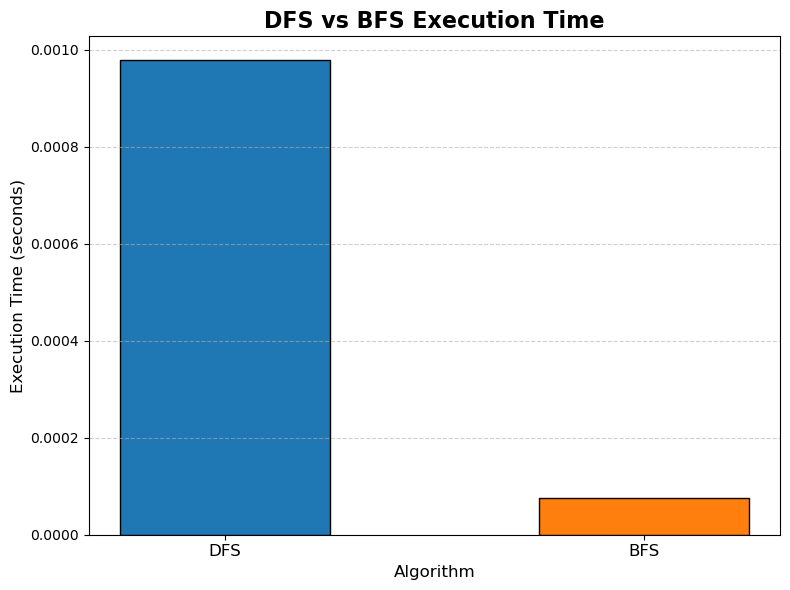

In [400]:

import matplotlib.pyplot as plt

# Function to display the execution times in a table
def print_execution_time_table(times):
    print("\n--- Execution Time Comparison Table ---")
    print("{:<10} {:>20}".format("Algorithm", "Execution Time (s)"))
    print("-" * 32)
    for alg, t in times.items():
        print("{:<10} {:>20.6f}".format(alg, t))

# Function to plot the execution times as a bar chart
def plot_execution_times(times):
    algorithms = list(times.keys())
    values = [times[alg] for alg in algorithms]

    plt.figure(figsize=(8, 6))

    # Color palette for the bars
    bars = plt.bar(algorithms, values, color=['#1f77b4', '#ff7f0e'], edgecolor='black', width=0.5)

    # Title and labels with better formatting
    plt.title("DFS vs BFS Execution Time", fontsize=16, fontweight='bold')
    plt.ylabel("Execution Time (seconds)", fontsize=12)
    plt.xlabel("Algorithm", fontsize=12)

    # Grid and bar labels
    plt.grid(axis='y', linestyle='--', alpha=0.6)

    # Improve the x-axis labels by rotating them
    plt.xticks(rotation=0, fontsize=12)

    # Increase margin to prevent clipping of the x-axis labels
    plt.tight_layout()

    # Show the plot
    plt.show()

# Assuming that these are the execution times you've already measured
execution_times = {
    'DFS': dfs_time,  # e.g., execution_time_dfs = 0.012345
    'BFS': bfs_time   # e.g., execution_time_bfs = 0.023456
}

# Call the functions to display the table and plot
print_execution_time_table(execution_times)
plot_execution_times(execution_times)


This code displays the execution times of DFS and BFS in a table and as a bar chart for comparison. It uses the print_execution_time_table function for the table and plot_execution_times for the chart.